# The Variational Autoencoder

## 1. Introduction

Written by Albert Li. If you have any questions or concerns, contact me at ahli [at] stanford [dot] edu.

### 1.1 Overview

This notebook is a code tutorial on the variational autoencoder (VAE). There are four examples. First, we learn a simple bivariate Gaussian distribution. Second, we learn a data distribution drawn from two separate bivariate Gaussians. Third, we learn to reconstruct data from the MNIST dataset. Fourth, we learn the MNIST dataset again but using the labels as conditioning variables. Along the way, I hope to highlight some relevant implementation details.

You should be running this notebook with a Python 3 kernel. You also need to make sure that whatever environment you're using has installed the dependencies in the imports section (numpy and torch). There is no GPU support for this code, since it should comfortably run on your personal CPU, but note that any serious attempt at modeling large models using high-dimensional data will need to contend with device management.

If you aren't familiar with PyTorch, I would encourage you to quickly go through the tutorial on their website: https://pytorch.org/tutorials/.

### 1.2 References

[1] D. P. Kingma and M. Welling, “Auto-encoding variational bayes,” *2nd International Conference on Learning Representations, ICLR 2014*, 2014.

[2] K. Sohn, H. Lee, and X. Yan, “Learning structured output representation using deep conditional generative models,” in *Advances in Neural Information Processing Systems 28*, C. Cortes, N. D. Lawrence, D. D. Lee, M. Sugiyama, and R. Garnett, Eds., Curran Associates, Inc., 2015, pp. 3483–3491.

## 2. Main Implementation

### 2.1 Imports and Utilities

This first block is a script that autoscrolls long cells (useful for viewing training progress without needing to manually scroll down every few seconds). It will produce a little checkbox next to outputs of cells that lets you toggle whether it auto-scrolls down. Note that clicking this applies the effect globally to all cells regardless of the appearance of the checkbox - this is just a minor bug that I can't be bothered to fix, since the impact is fairly small, but it's worth mentioning. Source: https://stackoverflow.com/questions/41539841/automatic-scroll-down-to-bottom-of-result-in-ipython-notebook

In [1]:
%%javascript

window.scroll_flag = true
window.scroll_exit = false
window.scroll_delay = 100

$(".output_scroll").each(function() {
    $(this)[0].scrollTop = $(this)[0].scrollHeight;
});

function callScrollToBottom() {
    setTimeout(scrollToBottom, window.scroll_delay);
}

function scrollToBottom() {
    if (window.scroll_exit) {
        return;
    }
    if (!window.scroll_flag) {
        callScrollToBottom();
        return;
    };

    $(".output_scroll").each(function() {
        if (!$(this).attr('scroll_checkbox')){
            window.scroll_flag = true;
            $(this).attr('scroll_checkbox',true);
            var div = document.createElement('div');
            var checkbox = document.createElement('input');
            checkbox.type = "checkbox";
            checkbox.onclick = function(){window.scroll_flag = checkbox.checked}
            checkbox.checked = "checked"
            div.append("Auto-Scroll-To-Bottom: ");
            div.append(checkbox);
            $(this).parent().before(div);
        }

        $(this)[0].scrollTop = $(this)[0].scrollHeight;
    });
    callScrollToBottom();
}
scrollToBottom();

<IPython.core.display.Javascript object>

In [2]:
import copy
from math import pi as pi
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data
import torchvision
from torchvision.datasets import MNIST as MNIST
from typing import List, Optional, Tuple

In [3]:
class MLP(nn.Module):
    """Helper class for initializing MLPs."""
    
    def __init__(
        self,
        input_dim: int,
        output_dim: int,
        hidden_layer_sizes: List[int],
        nonlinearity: nn.Module,
        dropout: Optional[float] = None,
        batchnorm: Optional[bool] = False,
    ) -> None:
        """Initialize the MLP. Activations are softpluses.

        Parameters
        ----------
        input_dim : int
            Dimension of the input.
        output_dim : int
            Dimension of the output variable.
        hidden_layer_sizes : List[int]
            List of sizes of all hidden layers.
        nonlinearity : torch.nn.Module
            A the nonlinearity to use (must be a torch module).
        dropout : float, default=None
            Dropout probability if applied.
        batchnorm : bool, default=False
            Flag for applying batchnorm. NOTE: there are a plethora of ways
            to apply batchnorm layers. I chose post-activations.
        """
        super(MLP, self).__init__()

        assert type(input_dim) == int
        assert type(output_dim) == int
        assert type(hidden_layer_sizes) == list
        assert all(type(n) is int for n in hidden_layer_sizes)

        # building MLP
        self._mlp = nn.Sequential()
        self._mlp.add_module("fc0", nn.Linear(input_dim, hidden_layer_sizes[0]))
        self._mlp.add_module("act0", nonlinearity)
        if dropout is not None and 0.0 <= dropout and dropout <= 1.0:
            self._mlp.add_module("do0", nn.Dropout(p=dropout))
        if batchnorm:
            self._mlp.add_module("bn0", nn.BatchNorm1d(hidden_layer_sizes[0]))
        for i, (in_size, out_size) in enumerate(
            zip(hidden_layer_sizes[:-1], hidden_layer_sizes[1:]), 1
        ):
            self._mlp.add_module(f"fc{i}", nn.Linear(in_size, out_size))
            self._mlp.add_module(f"act{i}", nonlinearity)
            if dropout is not None and 0.0 <= dropout and dropout <= 1.0:
                self._mlp.add_module("do{i}", nn.Dropout(p=dropout))
            if batchnorm:
                self._mlp.add_module("bn{i}", nn.BatchNorm1d(out_size))
        self._mlp.add_module("fcout", nn.Linear(hidden_layer_sizes[-1], output_dim))

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """Forward pass.

        Parameters
        ----------
        x : torch.Tensor, shape=(..., in_dim)
            Dimension of the input.

        Returns
        -------
        mlp_out : torch.Tensor, shape=(..., out_dim)
            Output tensor.
        """
        return self._mlp(x)

In [77]:
def gaussian_log_likelihood(mu: torch.Tensor, var: torch.Tensor, x: torch.Tensor) -> torch.Tensor:
    """Evaluates the log likelihood of diagonal-covariance Gaussian parameters given data.
    
    Parameters
    ----------
    mu : torch.Tensor, shape=(B, X)
        Batch of means of Gaussians.
    var : torch.Tensor, shape=(B, X)
        Batch of (diagonal) covariances of Gaussians.
    x : torch.Tensor, shape=(B, X)
        Batch of data.
        
    Returns
    -------
    ll : torch.Tensor, shape=(1)
        Batch-averaged log likelihood of the parameters.
    """
    B, X = x.shape
    ll = -torch.sum(torch.sum(0.5 * (torch.log(2 * pi * var) + (x - mu) ** 2 / var), dim=-1) + X) / B
    return ll

def gaussian_dkl(
    mu_1: torch.Tensor,
    var_1: torch.Tensor,
    mu_2: torch.Tensor = None,
    var_2: torch.Tensor = None
) -> torch.Tensor:
    """Computes the analytical KL divergence between two diagonal-covariance Gaussians.
    
    Consider two Gaussian distributions D_1 = N(mu_1, var_1) and D_2 = N(mu_2, var_2).
    This function will compute D_KL(D_1 || D_2). If the parameters of D_2 are none,
    then D_2 is assumed to be the standard normal distribution.
    
    Parameters
    ----------
    mu_1 : torch.Tensor, shape=(B, X)
        Mean of D_1.
    var_1 : torch.Tensor, shape=(B, X)
        Diagonal entries of covariance of D_1.
    mu_2 : torch.Tensor, shape=(B, X), default=None
        Mean of D_2. Optional.
    var_2 : torch.Tensor, shape=(B, X), default=None
        Diagonal entries of covariance of D_2. Optional.
        
    Returns
    -------
    dkl : torch.Tensor, shape=(1)
        The batch-averged KL divergence.
    """
    B, X = mu_1.shape
    if mu_2 is None or var_2 is None:
        dkl = 0.5 * torch.sum(torch.sum(-torch.log(var_1) + var_1 + mu_1 ** 2, dim=-1) - X) / B
    else:
        dkl = 0.5 * torch.sum(
            torch.sum(torch.log(var_2) - torch.log(var_1) + (var_1 + (mu_2 - mu_1) ** 2) / var_2, dim=-1) - X
        ) / B
    return dkl

def one_hot_mnist(c: torch.LongTensor) -> torch.Tensor:
    """Converts an integer label into a one-hot vector for MNIST data.
    
    Parameters
    ----------
    c : torch.LongTensor, shape=(B, 1)
        Batch of input labels. Must be in range [0, 9]. NOTE: this should be a Long Tensor.
        
    Returns
    -------
    ohv : torch.Tensor, shape=(B, 10)
        Batch of one-hot vectors.
    """
    B = c.shape[0]
    ohv = torch.zeros_like(c).float().repeat(1, 10)
    ohv.scatter_(1, c, 1)
    return ohv

### 2.2 VAE Code

This first VAE is for modeling some vanilla Gaussian distributions.

We choose the encoder and decoder distributions as diagonal covariance Gaussians like in the Kingma paper. The prior is fixed as the standard normal distribution. The choice of diagonal covariance Gaussians means that representing the distribution over some *n*-dimensional random variable, we simply output *2n* variables, *n* for the mean and *n* for the log-variances. We parameterize these distributions as multilayer perceptrons (MLPs).

Note that we choose our networks to output log-variances. This is because every valid (and non-degenerate) covariance matrix has strictly positive diagonal entries. We can therefore pass the outputs through an element-wise exponential to recover positive values, even if the network has negative outputs. This is an extremely common trick in learning when recovering positive values is required.

In [5]:
class VAE1(nn.Module):
    """Variational Autoencoder (VAE)."""
    
    def __init__(self, latent_dim: int, obs_dim: int) -> None:
        """Initialize a VAE for modeling continuous data.
        
        Parameters
        ----------
        latent_dim : int
            Dimension of the latent space. Denoted n in the code.
        obs_dim : int
            Dimension of the observation space. Denoted p in the code.
        """
        super(VAE1, self).__init__()
        
        # assigning dimensions
        self._latent_dim = latent_dim
        self._obs_dim = obs_dim
        
        # initializing networks
        self._encoder = MLP(
            obs_dim,
            2 * latent_dim,
            [16, 16, 16],
            nn.Softplus(beta=2),
        )
        self._decoder = MLP(
            latent_dim,
            2 * obs_dim,
            [16, 16, 16],
            nn.Softplus(beta=2),
        )
    
    def forward(self, x: torch.Tensor) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor, torch.Tensor]:
        """Forward pass of the VAE.
        
        Parameters
        ----------
        x : torch.Tensor, shape=(B, p)
            Batch of input data.
            
        Returns
        -------
        mu_e : torch.Tensor, shape=(B, n)
            Batch of means of encodings of x.
        var_e : torch.Tensor, shape=(B, n)
            Batch of (diagonal) covariances of encodings of x.
        mu_d : torch.Tensor, shape=(B, p)
            Batch of means of reconstructions of x.
        var_d : torch.Tensor, shape=(B, p)
            Batch of (diagonal) covariances of reconstructions of x.
        """
        # shapes
        n = self._latent_dim
        p = self._obs_dim
        
        # encoder
        out_e = self._encoder(x)
        mu_e = out_e[..., :n]
        var_e = torch.exp(out_e[..., n:])
        
        # reparameterization
        z = self.reparameterize(mu_e, var_e)
        
        # decoder
        out_d = self._decoder(z)
        mu_d = out_d[..., :p]
        var_d = torch.exp(out_d[..., p:])
        
        return mu_e, var_e, mu_d, var_d
    
    def loss(
        self,
        x: torch.Tensor,
        mu_e: torch.Tensor,
        var_e: torch.Tensor,
        mu_d: torch.Tensor,
        var_d: torch.Tensor,
    ) -> torch.Tensor:
        """Compute the loss.
        
        Parameters
        ----------
        See docstring for forward().
        
        Returns
        -------
        loss : torch.Tensor, shape=(1)
            The VAE loss.
        """
        loss_recon = -gaussian_log_likelihood(mu_d, var_d, x)
        loss_dkl = gaussian_dkl(mu_e, var_e)
        loss = loss_recon + loss_dkl
        return loss
    
    def reparameterize(self, mu: torch.Tensor, var: torch.Tensor) -> torch.Tensor:
        """Execute the reparameterization trick.
        
        Parameters
        ----------
        mu : torch.Tensor, shape=(B, X)
            Batch of input means.
        var : torch.Tensor, shape=(B, X)
            Batch of input (diagonal) covariances.
            
        Returns
        -------
        y : torch.Tensor, shape=(B, X)
            Sample from N(mu, var)
        """
        eps = torch.randn_like(var)
        y = mu + torch.sqrt(var) * eps  # element-wise because of diagonal covariance
        return y
    
    def generate(self, num_samples: int) -> torch.Tensor:
        """Generate data.
        
        Parameters
        ----------
        num_samples : int
            Number of samples to generate.
        
        Returns
        -------
        x_gen : torch.Tensor, shape=(num_samples, p)
            Generated observations.
        """
        # shapes
        n = self._latent_dim
        p = self._obs_dim

        # generation
        z_gen = torch.randn(num_samples, n)  # drawing a sample from the latent prior
        out_d = self._decoder(z_gen)  # decoding the random sample
        mu_gen = out_d[..., :p]
        var_gen = torch.exp(out_d[..., p:])
        eps = torch.randn_like(var_gen)
        x_gen = mu_gen + torch.sqrt(var_gen) * eps
        
        return x_gen

This second VAE is for modeling single-channel images (namely, for MNIST data).

The encoder functions similarly as before - it parameterizes a diagonal-covariance multivariate Gaussian. However, the decoder in this implementation does not represent a probability distribution, but is instead a *deterministic* decoder with a sigmoid final layer. Some reasons for this choice:

1) The data are not continuous, but are instead *quantized* pixel values (normalized between 0 and 1). Therefore, we need a function with an appropriate domain of [0, 1]. This also means we will use a *binary cross-entropy* loss, which works on data with values between 0 and 1.

2) The aforementioned quantization makes it harder to cleanly define a probabilistic decoder for the image sampling problem. For work on this, look up work like PixelCNN (they use quantized logistic distributions). Since the point of this tutorial is demonstrating how a VAE works, I skimped out on this detail.

Finally, it is reasonable to use convolutional neural networks instead of MLPs since we're dealing with images. MNIST data are small enough to allow MLPs to train at a not-too-slow rate.

In [6]:
class VAE2(nn.Module):
    """Variational Autoencoder (VAE)."""
    
    def __init__(self, latent_dim: int, obs_dim: int) -> None:
        """Initialize a VAE for modeling LxL single channel images.
        
        Parameters
        ----------
        latent_dim : int
            Dimension of the latent space. Denoted n in the code.
        obs_dim : int
            Dimension of the observation space. Denoted p in the code.
            NOTE: we assume the data is flattened before encoding and
            decoding will return flattened data as well.
        """
        super(VAE2, self).__init__()
        
        # assigning dimensions
        self._latent_dim = latent_dim
        self._obs_dim = obs_dim
        
        # initializing networks
        self._encoder = MLP(
            obs_dim,
            2 * latent_dim,
            [256, 128],
            nn.Softplus(beta=2),
        )
        self._decoder = nn.Sequential(
            MLP(
                latent_dim,
                obs_dim,
                [128, 256],
                nn.Softplus(beta=2),
            ),
            nn.Sigmoid(),
        )
    
    def forward(self, x: torch.Tensor) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor]:
        """Forward pass of the VAE.
        
        Parameters
        ----------
        x : torch.Tensor, shape=(B, C, sqrt(p), sqrt(p))
            Batch of input data (channel images).
            
        Returns
        -------
        mu_e : torch.Tensor, shape=(B, n)
            Batch of means of encodings of x.
        var_e : torch.Tensor, shape=(B, n)
            Batch of (diagonal) covariances of encodings of x.
        x_recon_flat : torch.Tensor, shape=(B, p)
            Batch of flattened reconstructions.
        """
        # shapes
        n = self._latent_dim
        p = self._obs_dim
        
        # encoder
        out_e = self._encoder(x.reshape(-1, p))
        mu_e = out_e[..., :n]
        var_e = torch.exp(out_e[..., n:]) + 1e-6  # regularization
        
        # reparameterization
        z = self.reparameterize(mu_e, var_e)
        
        # decoder
        x_recon_flat = self._decoder(z)
        
        return mu_e, var_e, x_recon_flat
    
    def loss(
        self,
        x: torch.Tensor,
        x_recon_flat: torch.Tensor,
        mu_e: torch.Tensor,
        var_e: torch.Tensor,
    ) -> torch.Tensor:
        """Compute the loss.
        
        Parameters
        ----------
        See docstring for forward().
        
        Returns
        -------
        loss : torch.Tensor, shape=(1)
            The VAE loss.
        """
        B = x.shape[0]
        loss_recon = F.binary_cross_entropy(x_recon_flat, x.reshape(-1, 784), reduction='sum') / B
        loss_dkl = gaussian_dkl(mu_e, var_e)
        loss = loss_recon + loss_dkl
        return loss
    
    def reparameterize(self, mu: torch.Tensor, var: torch.Tensor) -> torch.Tensor:
        """Execute the reparameterization trick for diagonal-covariance Gaussian.
        
        Parameters
        ----------
        mu : torch.Tensor, shape=(B, X)
            Batch of input means.
        var : torch.Tensor, shape=(B, X)
            Batch of input (diagonal) covariances.
            
        Returns
        -------
        y : torch.Tensor, shape=(B, X)
            Sample from N(mu, var)
        """
        eps = torch.randn_like(var)
        y = mu + torch.sqrt(var) * eps  # element-wise because of diagonal covariance
        return y
    
    def generate(self, num_samples: int) -> torch.Tensor:
        """Generate data.
        
        Parameters
        ----------
        num_samples : int
            Number of samples to generate.
        
        Returns
        -------
        x_gen : torch.Tensor, shape=(num_samples, sqrt(p), sqrt(p))
            Generated image data of proper shape.
        """
        # shapes
        n = self._latent_dim
        p = self._obs_dim
        L = int(np.sqrt(p))

        # generation
        z_gen = torch.randn(num_samples, n)  # drawing a sample from the latent prior
        x_gen_flat = self._decoder(z_gen)  # decoding the random sample
        if num_samples == 1:
            x_gen = x_gen_flat.reshape(L, L)
        else:
            x_gen = x_gen_flat.reshape(-1, L, L)
        
        return x_gen

This third VAE is conditional, also for MNIST data. The task will be predicting/generating data given the label.

In [69]:
class CVAE(nn.Module):
    """Conditional Variational Autoencoder (CVAE)."""
    
    def __init__(self, latent_dim: int, obs_dim: int, input_dim: int) -> None:
        """Initialize a CVAE for modeling LxL single channel images.
        
        Parameters
        ----------
        latent_dim : int
            Dimension of the latent space. Denoted n in the code.
        obs_dim : int
            Dimension of the observation space. Denoted p in the code.
            NOTE: we assume the data is flattened before encoding and
            decoding will return flattened data as well.
        input_dim : int
            Dimension of the conditioning input. Denoted m in the code.
        """
        super(CVAE, self).__init__()
        
        # assigning dimensions
        self._latent_dim = latent_dim
        self._obs_dim = obs_dim
        self._input_dim = input_dim
        
        # initializing networks
        self._encoder = MLP(
            obs_dim + input_dim,
            2 * latent_dim,
            [256, 128],
            nn.Softplus(beta=2),
        )
        self._decoder = nn.Sequential(
            MLP(
                latent_dim + input_dim,
                obs_dim,
                [128, 256],
                nn.Softplus(beta=2),
            ),
            nn.Sigmoid(),
        )
        self._prior = MLP(
            input_dim,
            2 * latent_dim,
            [256, 128],
            nn.Softplus(beta=2),
        )
    
    def forward(
        self,
        x: torch.Tensor,
        c: torch.Tensor
    ) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor, torch.Tensor, torch.Tensor]:
        """Forward pass of the VAE.
        
        Parameters
        ----------
        x : torch.Tensor, shape=(B, C, sqrt(p), sqrt(p))
            Batch of input data (channel images).
        c : torch.Tensor, shape=(B, m)
            Batch of conditioning variables (integers in [0, 9]).
            
        Returns
        -------
        mu_e : torch.Tensor, shape=(B, n)
            Batch of means of encodings of x.
        var_e : torch.Tensor, shape=(B, n)
            Batch of (diagonal) covariances of encodings of x.
        mu_p : torch.Tensor, shape=(B, n)
            Batch of means of conditional latent prior.
        var_p : torch.Tensor, shape=(B, n)
            Batch of (diagonal) covariances of conditional latent prior.
        x_recon_flat : torch.Tensor, shape=(B, p)
            Batch of flattened reconstructions.
        """
        # shapes
        n = self._latent_dim
        p = self._obs_dim
        m = self._input_dim
        
        # prior
        out_p = self._prior(c)
        mu_p = out_p[..., :n]
        var_p = torch.exp(out_p[..., n:]) + 1e-6  # regularization
        
        # encoder
        out_e = self._encoder(torch.cat([x.reshape(-1, p), c], dim=-1))
        mu_e = out_e[..., :n]
        var_e = torch.exp(out_e[..., n:]) + 1e-6  # regularization
        
        # reparameterization
        z = self.reparameterize(mu_e, var_e)
        
        # decoder
        x_recon_flat = self._decoder(torch.cat([z, c], dim=-1))
        
        return mu_e, var_e, mu_p, var_p, x_recon_flat
    
    def loss(
        self,
        x: torch.Tensor,
        x_recon_flat: torch.Tensor,
        mu_e: torch.Tensor,
        var_e: torch.Tensor,
        mu_p: torch.Tensor,
        var_p: torch.Tensor,
    ) -> torch.Tensor:
        """Compute the loss.
        
        Parameters
        ----------
        See docstring for forward().
        
        Returns
        -------
        loss : torch.Tensor, shape=(1)
            The VAE loss.
        """
        B = x.shape[0]
        loss_recon = F.binary_cross_entropy(x_recon_flat, x.reshape(-1, 784), reduction='sum') / B
        loss_dkl = gaussian_dkl(mu_e, var_e, mu_p, var_p)
        loss = loss_recon + loss_dkl
        return loss
    
    def reparameterize(self, mu: torch.Tensor, var: torch.Tensor) -> torch.Tensor:
        """Execute the reparameterization trick for diagonal-covariance Gaussian.
        
        Parameters
        ----------
        mu : torch.Tensor, shape=(B, X)
            Batch of input means.
        var : torch.Tensor, shape=(B, X)
            Batch of input (diagonal) covariances.
            
        Returns
        -------
        y : torch.Tensor, shape=(B, X)
            Sample from N(mu, var)
        """
        eps = torch.randn_like(var)
        y = mu + torch.sqrt(var) * eps  # element-wise because of diagonal covariance
        return y
    
    def generate(self, num_samples: int, c: torch.Tensor) -> torch.Tensor:
        """Generate data.
        
        Parameters
        ----------
        num_samples : int
            Number of samples to generate.
        c : torch.Tensor, shape=(B, m)
            Batch of conditioning variables (integers in [0, 9]).
        
        Returns
        -------
        x_gen : torch.Tensor, shape=(num_samples, sqrt(p), sqrt(p))
            Generated image data of proper shape.
        """
        # shapes
        n = self._latent_dim
        p = self._obs_dim
        L = int(np.sqrt(p))

        # drawing a sample from the latent prior
        out_p = self._prior(c)
        mu_p = out_p[..., :n]
        var_p = torch.exp(out_p[..., n:]) + 1e-6  # regularization
        z_gen = self.reparameterize(mu_p, var_p)
        
        # decoding the random sample
        x_gen_flat = self._decoder(torch.cat([z_gen, c], dim=-1))
        if num_samples == 1:
            x_gen = x_gen_flat.reshape(L, L)
        else:
            x_gen = x_gen_flat.reshape(-1, L, L)
            
        return x_gen

### 2.3 Training/Evaluation Code

In [70]:
def train(
    model: nn.Module,
    epochs: int,
    train_loader: torch.utils.data.DataLoader,
    optimizer: torch.optim.Optimizer,
    scheduler: Optional[torch.optim.lr_scheduler.StepLR] = None,
    vae_type: int = 1,
    print_iter: int = 10,
    ckpt_path: str = None,
) -> Tuple[List[nn.Module], List[int]]:
    """Training loop.
    
    Parameters
    ----------
    model : nn.Module
        The model to train.
    epochs : int
        The number of training epochs.
    train_loader : torch.utils.data.DataLoader
        The data loader with training data.
    optimizer : torch.optim.Optimizer
        The optimizer.
    scheduler : Optional[torch.optim.lr_scheduler.StepLR]
        The learning rate scheduler. I suggest a step scheduler, but you can use any.
    vae_type : int, default=1
        Type of vae. Choices: {1, 2}
    print_iter : int, default=10
        Iterations between training printouts.
    ckpt_path : str, default=None
        Path to a checkpoint to load to continue training.
        
    Returns
    -------
    model_list : List[nn.Module]
        A list of snapshots of the model at each epoch of training.
    loss_list : List[int]
        A list of losses of the model at each epoch of training.
    """
    if ckpt_path is not None:
        model.load_state_dict(torch.load(ckpt_path))
        print('Loaded Checkpoint!')
    model.train()  # training mode
    
    iteration = 1
    model_list = []
    loss_list = []
    
    for epoch in range(epochs):
        for batch_idx, minibatch in enumerate(train_loader):
            optimizer.zero_grad()  # reset gradients

            # check model type
            if vae_type == 1:
                # gradient step
                mu_e, var_e, mu_d, var_d = model(minibatch)
                loss = model.loss(minibatch, mu_e, var_e, mu_d, var_d)
                
            elif vae_type == 2:
                minibatch = minibatch[0]  # tuple with label - we don't need the label
                mu_e, var_e, x_recon_flat = model(minibatch)
                loss = model.loss(minibatch, x_recon_flat, mu_e, var_e)
                
            elif vae_type == 3:
                data = minibatch[0]
                c = minibatch[1].unsqueeze(-1)  # labels
                c = one_hot_mnist(c)  # converting to one-hot vectors
                mu_e, var_e, mu_p, var_p, x_recon_flat = model(data, c)
                loss = model.loss(data, x_recon_flat, mu_e, var_e, mu_p, var_p)
                
            else:
                raise NotImplementedError

            # update parameters
            loss.backward()
            optimizer.step()
                
            # printing training information every 100 iterations
            if iteration % print_iter == 0:
                print(f"Epoch: {epoch + 1}\tIteration: {iteration}\tLoss: {loss.item():.4f}")
            
            iteration = iteration + 1
            
        # advance the lr scheduler
        if scheduler is not None:
            scheduler.step()
        
        # update cached performance of the model
        model_list.append(copy.deepcopy(model))
        loss_list.append(loss.item())
    
    return model_list, loss_list

In [93]:
def eval(
    model_list: List[nn.Module],
    loss_list: List[int],
    valid_loader: torch.utils.data.DataLoader,
    optimizer: torch.optim.Optimizer,
    vae_type: int = 1,
) -> None:
    """Evaluate the model at various stages of training.
    
    Parameters
    ----------
    See docstring of train().
    """
    epoch = 1
    for model in model_list:
        model.eval()  # set model to evaluation mode

        with torch.no_grad():
            # computing validation loss
            data = valid_loader.dataset
            
            # checking model type
            if vae_type == 1:
                # compute loss
                mu_e, var_e, mu_d, var_d = model(data)
                valid_loss = model.loss(data, mu_e, var_e, mu_d, var_d)
                print(f"Epoch {epoch} Average Validation Loss: {valid_loss.item():.4f}")

                # recovering reconstructed data samples
                eps_recon = torch.randn_like(var_d)
                x_hat = mu_d + torch.sqrt(var_d) * eps_recon
                valid_data_x = valid_loader.dataset[:, 0].numpy()
                valid_data_y = valid_loader.dataset[:, 1].numpy()

                # generating data
                num_valid_pts = valid_data_x.shape[0]
                x_gen = model.generate(num_valid_pts)

                # plotting data
                plt.scatter(valid_data_x, valid_data_y, c='r', s=5)
                plt.scatter(x_hat[:, 0], x_hat[:,1], c='b', s=5)
                plt.scatter(x_gen[:, 0], x_gen[:,1], c='g', s=5)
                plt.title(f"Data, Reconstructions, and Samples: Epoch {epoch}")

                # plot style
                plt.xlabel('x1')
                plt.ylabel('x2')
                plt.legend(
                    ['Validation Data', 'Reconstructed Data', 'Generated Data'],
                    bbox_to_anchor=(1.04,1),
                    loc="upper left",
                )
                ax = plt.gca()
                plt.axis('square')
                ax.set_aspect(1./ax.get_data_ratio())
                ax.margins(0.1)
                plt.show()
                
            elif vae_type == 2:
                valid_data = data.data.float() / 255.0  # normalizing the pixels
                
                # compute loss
                mu_e, var_e, x_recon_flat = model(valid_data)
                valid_loss = model.loss(valid_data, x_recon_flat, mu_e, var_e)
                print(f"Epoch {epoch} Average Validation Loss: {valid_loss.item():.4f}")

                # specific example to reconstruct
                example_img = valid_data.reshape(-1, 28, 28)[0]
                _, _, x_recon_flat = model(example_img)
                x_recon = x_recon_flat.reshape(28, 28)
                x_gen = model.generate(1)
                
                # plots
                fig = plt.figure()
                plt.suptitle(f"Epoch: {epoch}", fontsize=14)
                ax1 = fig.add_subplot(131)
                ax2 = fig.add_subplot(132)
                ax3 = fig.add_subplot(133)
                ax1.imshow(example_img.numpy(), cmap="gray")
                ax1.set_title('Validation Sample')
                ax2.imshow(x_recon.numpy(), cmap="gray")
                ax2.set_title('Reconstructed Sample')
                ax3.imshow(x_gen.numpy(), cmap="gray")
                ax3.set_title('Generated Sample')
                plt.tight_layout()
            
            elif vae_type == 3:
                valid_data = data.data.float() / 255.0  # normalizing the pixels
                valid_labels = data.targets.unsqueeze(-1)
                valid_labels = one_hot_mnist(valid_labels)
                
                # compute loss
                mu_e, var_e, mu_p, var_p, x_recon_flat = model(valid_data, valid_labels)
                valid_loss = model.loss(valid_data, x_recon_flat, mu_e, var_e, mu_p, var_p)
                print(f"Epoch {epoch} Average Validation Loss: {valid_loss.item():.4f}")
                
                # specific example to reconstruct
                example_img = valid_data.reshape(-1, 28, 28)[0]
                _, _, _, _, x_recon_flat = model(example_img, valid_labels[0, ...].unsqueeze(0))
                x_recon = x_recon_flat.reshape(28, 28)
                _label_gen = torch.randint(9, (1, 1))
                label_gen = one_hot_mnist(_label_gen)
                x_gen = model.generate(1, label_gen)
                
                # plots
                fig = plt.figure()
                plt.suptitle(f"Epoch: {epoch}", fontsize=14)
                ax1 = fig.add_subplot(131)
                ax2 = fig.add_subplot(132)
                ax3 = fig.add_subplot(133)
                ax1.imshow(example_img.numpy(), cmap="gray")
                ax1.set_title('Validation Sample')
                ax2.imshow(x_recon.numpy(), cmap="gray")
                ax2.set_title('Reconstructed Sample')
                ax3.imshow(x_gen.numpy(), cmap="gray")
                ax3.set_title(f'Generated Sample: {_label_gen.item()}')
                plt.tight_layout()
                
            else:
                raise NotImplementedError
            epoch = epoch + 1
            
    # plotting loss curve
    losses = np.array(loss_list)
    plt.figure()
    plt.plot(losses)
    plt.title("Loss Over Time")
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.show()

## 3. Example 1: Learning a Multivariate Gaussian

This first example is simple: learn the distribution of data drawn from a bivariate Gaussian distribution. If you are jumping between running code in different sections, make sure to run all the code in this section from the start, since some variables are shared in the namespace.

### 3.1 Generating Data

In [10]:
# dataset statistics
obs_dim = 2
mu_data = torch.Tensor([2.0, 5.0])
cov_data = torch.Tensor(
    [[15.0, -10.0],
     [-10.0, 10.0]]
)
L_data = torch.cholesky(cov_data)

# generating training and validation sets
num_train_pts = 1000
num_valid_pts = 1000

eps_train = torch.randn(2, num_train_pts)
eps_valid = torch.randn(2, num_valid_pts)

train_data_ex1 = mu_data + (L_data @ eps_train).transpose(-1, -2)
valid_data_ex1 = mu_data + (L_data @ eps_valid).transpose(-1, -2)

### 3.2 Training Settings

You should play around with the settings in this section. I choose the ADAM optimizer and a step learning scheduler, so the hyperparameters will correspondingly only be appropriate for those choices. As is convention, the reparameterization trick is coded to produce only one sample, so this is not a tunable hyperparameter.

In [11]:
# hyperparameters
latent_dim = 2
batch_size = 32
epochs = 100
lr = 1e-2  # initial learning ratex_mean = vae_2d.generate(z_mu)
step_size = 50  # steps per decay for lr scheduler
gamma = 0.9  # multiplicative decay for lr scheduler

Don't mess with the code in this section unless you want to change the optimizer or LR scheduler.

In [12]:
# preparing dataloaders, optimizer, and scheduler
model_ex1 = VAE1(latent_dim, obs_dim)
train_loader_ex1 = torch.utils.data.DataLoader(
    train_data_ex1,
    batch_size=batch_size,
    shuffle=True,
    drop_last=True,
)
valid_loader_ex1 = torch.utils.data.DataLoader(
    valid_data_ex1,
    batch_size=batch_size,
    shuffle=True,
    drop_last=True,
)
optimizer_ex1 = optim.Adam(model_ex1.parameters(), lr=lr)
scheduler_ex1 = optim.lr_scheduler.StepLR(optimizer=optimizer_ex1, step_size=step_size, gamma=gamma)

### 3.3 Training

Run this cell to train the model.

In [13]:
model_list_ex1, loss_list_ex1 = train(
    model_ex1,
    epochs,
    train_loader_ex1,
    optimizer_ex1,
    scheduler=scheduler_ex1
)

Epoch: 1	Iteration: 10	Loss: 11.5047
Epoch: 1	Iteration: 20	Loss: 8.0724
Epoch: 1	Iteration: 30	Loss: 7.7495
Epoch: 2	Iteration: 40	Loss: 7.3685
Epoch: 2	Iteration: 50	Loss: 7.2543
Epoch: 2	Iteration: 60	Loss: 7.3648
Epoch: 3	Iteration: 70	Loss: 7.3786
Epoch: 3	Iteration: 80	Loss: 7.2248
Epoch: 3	Iteration: 90	Loss: 7.0294
Epoch: 4	Iteration: 100	Loss: 7.3541
Epoch: 4	Iteration: 110	Loss: 7.4473
Epoch: 4	Iteration: 120	Loss: 7.2754
Epoch: 5	Iteration: 130	Loss: 7.0107
Epoch: 5	Iteration: 140	Loss: 7.2079
Epoch: 5	Iteration: 150	Loss: 7.3679
Epoch: 6	Iteration: 160	Loss: 7.2987
Epoch: 6	Iteration: 170	Loss: 7.0208
Epoch: 6	Iteration: 180	Loss: 6.9751
Epoch: 7	Iteration: 190	Loss: 7.4767
Epoch: 7	Iteration: 200	Loss: 7.1954
Epoch: 7	Iteration: 210	Loss: 7.5336
Epoch: 8	Iteration: 220	Loss: 7.1899
Epoch: 8	Iteration: 230	Loss: 7.3565
Epoch: 8	Iteration: 240	Loss: 7.9131
Epoch: 9	Iteration: 250	Loss: 7.2393
Epoch: 9	Iteration: 260	Loss: 7.3458
Epoch: 9	Iteration: 270	Loss: 7.4796
Epoch: 10

Epoch: 71	Iteration: 2180	Loss: 6.9473
Epoch: 71	Iteration: 2190	Loss: 7.6102
Epoch: 71	Iteration: 2200	Loss: 7.6438
Epoch: 72	Iteration: 2210	Loss: 7.3140
Epoch: 72	Iteration: 2220	Loss: 7.5148
Epoch: 72	Iteration: 2230	Loss: 7.3154
Epoch: 73	Iteration: 2240	Loss: 7.0906
Epoch: 73	Iteration: 2250	Loss: 6.6883
Epoch: 73	Iteration: 2260	Loss: 7.2612
Epoch: 74	Iteration: 2270	Loss: 7.8106
Epoch: 74	Iteration: 2280	Loss: 7.0369
Epoch: 74	Iteration: 2290	Loss: 7.4030
Epoch: 75	Iteration: 2300	Loss: 7.3839
Epoch: 75	Iteration: 2310	Loss: 6.9636
Epoch: 75	Iteration: 2320	Loss: 6.7649
Epoch: 76	Iteration: 2330	Loss: 6.9563
Epoch: 76	Iteration: 2340	Loss: 6.8854
Epoch: 76	Iteration: 2350	Loss: 7.3266
Epoch: 77	Iteration: 2360	Loss: 7.0194
Epoch: 77	Iteration: 2370	Loss: 7.1844
Epoch: 77	Iteration: 2380	Loss: 7.0271
Epoch: 78	Iteration: 2390	Loss: 6.8972
Epoch: 78	Iteration: 2400	Loss: 6.5850
Epoch: 78	Iteration: 2410	Loss: 7.1051
Epoch: 79	Iteration: 2420	Loss: 6.7975
Epoch: 79	Iteration: 2430

### 3.4 Evaluation

Run this code to evaluate the model and see the progress it made during training. The reconstructed samples show the ability of the VAE to autoencode: to recreate the data once given. The generated samples show the ability of the VAE to generate samples: to reproduce the data distribution without seeing the validation data. You may need to uncheck "Auto-Scroll-To-Bottom" to scroll up and see earlier plots.

Epoch 1 Average Validation Loss: 7.6210


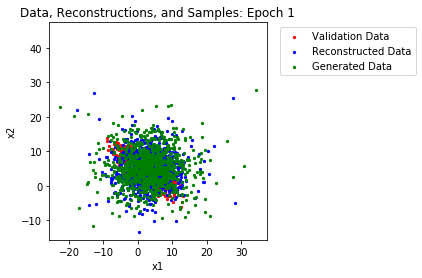

Epoch 2 Average Validation Loss: 7.3198


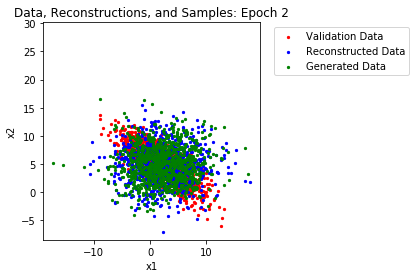

Epoch 3 Average Validation Loss: 7.2999


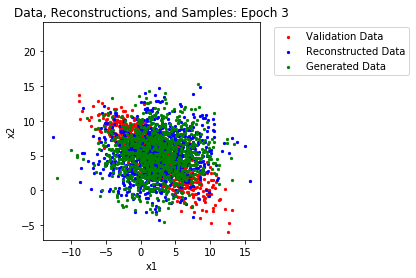

Epoch 4 Average Validation Loss: 7.3071


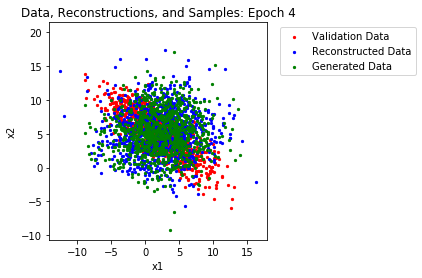

Epoch 5 Average Validation Loss: 7.3000


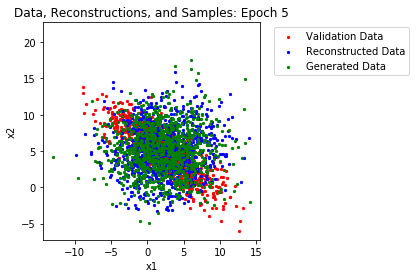

Epoch 6 Average Validation Loss: 7.2993


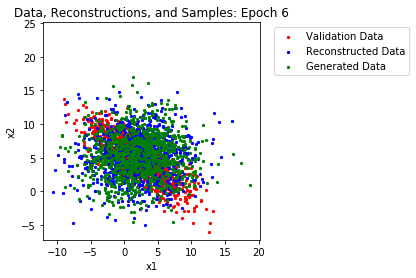

Epoch 7 Average Validation Loss: 7.3111


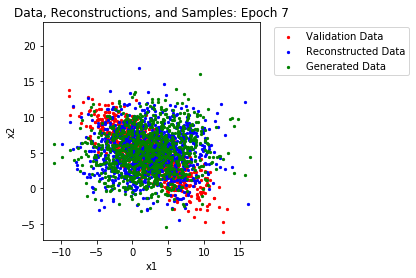

Epoch 8 Average Validation Loss: 7.2998


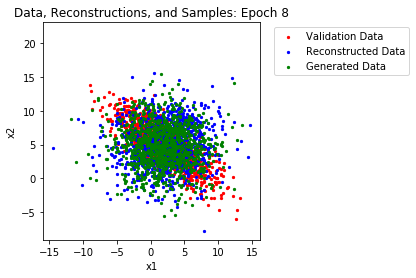

Epoch 9 Average Validation Loss: 7.2956


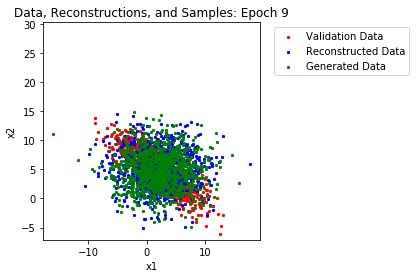

Epoch 10 Average Validation Loss: 7.3022


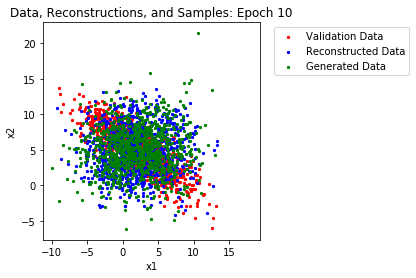

Epoch 11 Average Validation Loss: 7.2882


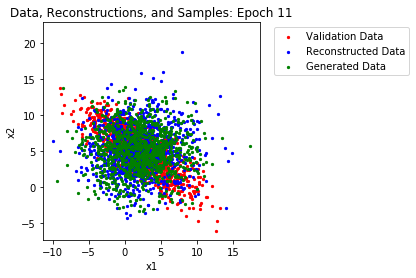

Epoch 12 Average Validation Loss: 7.3089


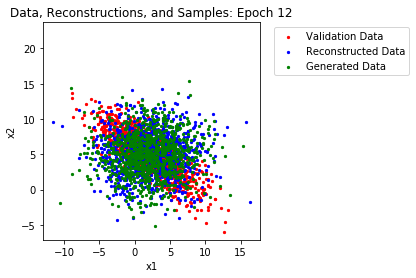

Epoch 13 Average Validation Loss: 7.2993


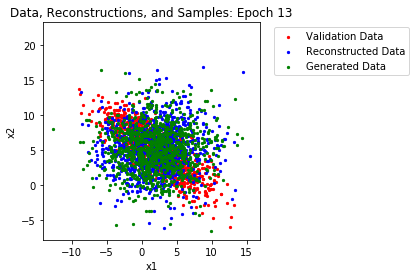

Epoch 14 Average Validation Loss: 7.3195


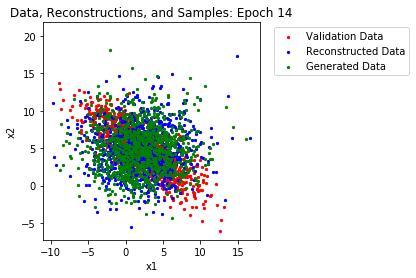

Epoch 15 Average Validation Loss: 7.2889


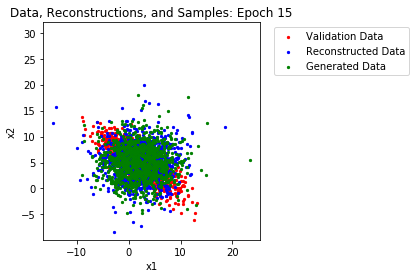

Epoch 16 Average Validation Loss: 7.3021


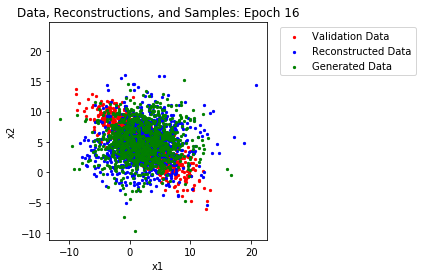

Epoch 17 Average Validation Loss: 7.3042


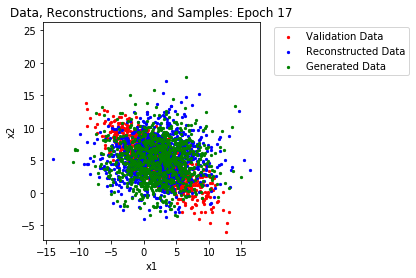

Epoch 18 Average Validation Loss: 7.3123


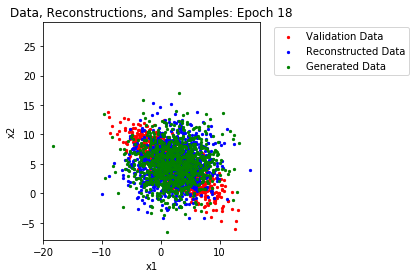

Epoch 19 Average Validation Loss: 7.2991


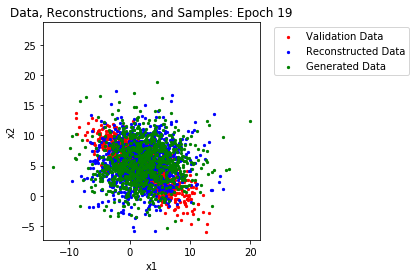

Epoch 20 Average Validation Loss: 7.3105


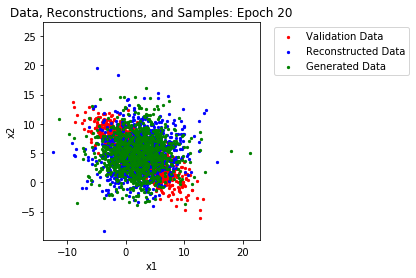

Epoch 21 Average Validation Loss: 7.3344


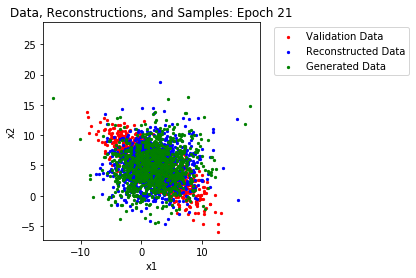

Epoch 22 Average Validation Loss: 7.3143


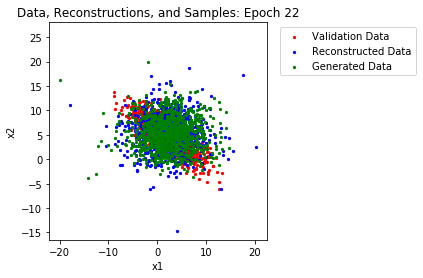

Epoch 23 Average Validation Loss: 7.2810


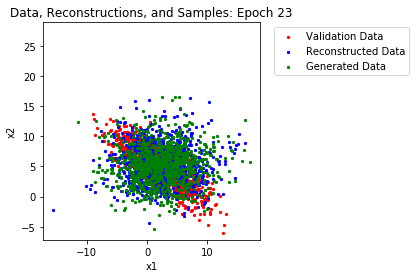

Epoch 24 Average Validation Loss: 7.2826


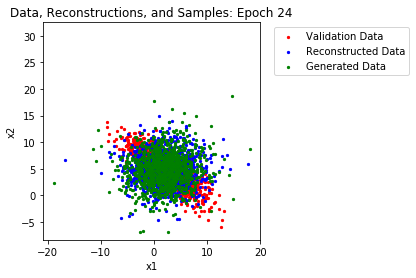

Epoch 25 Average Validation Loss: 7.2930


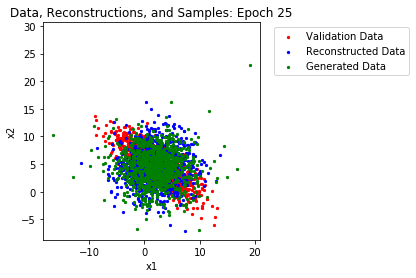

Epoch 26 Average Validation Loss: 7.2551


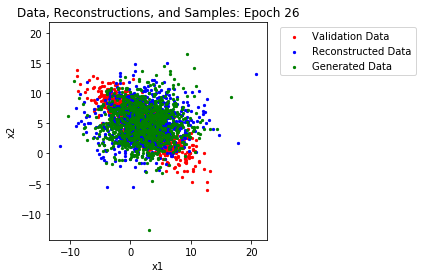

Epoch 27 Average Validation Loss: 7.2869


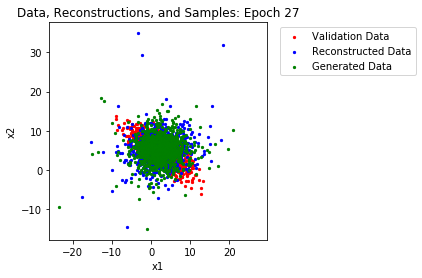

Epoch 28 Average Validation Loss: 7.2892


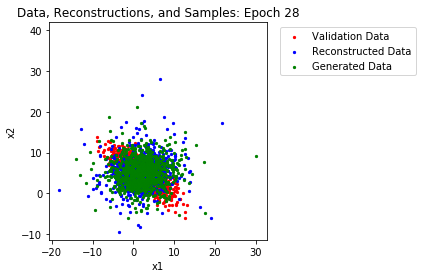

Epoch 29 Average Validation Loss: 7.3068


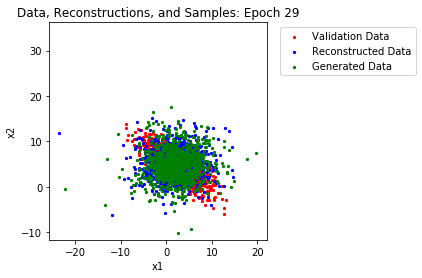

Epoch 30 Average Validation Loss: 7.2650


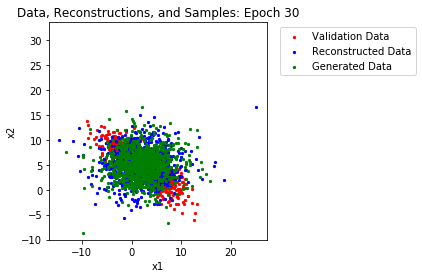

Epoch 31 Average Validation Loss: 7.2984


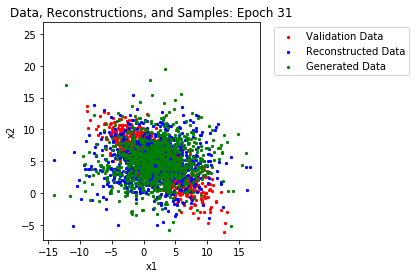

Epoch 32 Average Validation Loss: 7.2710


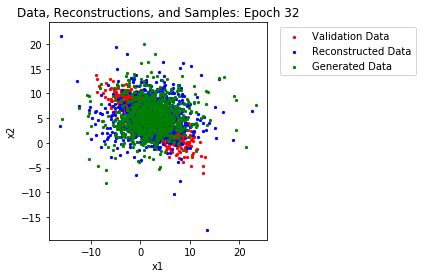

Epoch 33 Average Validation Loss: 7.2708


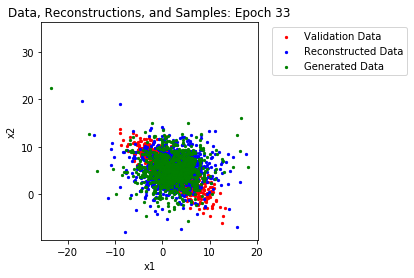

Epoch 34 Average Validation Loss: 7.2611


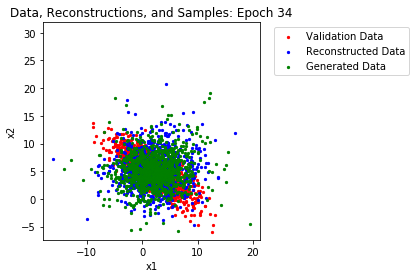

Epoch 35 Average Validation Loss: 7.2852


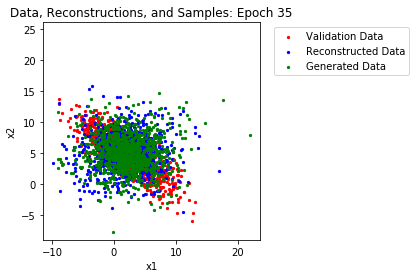

Epoch 36 Average Validation Loss: 7.3013


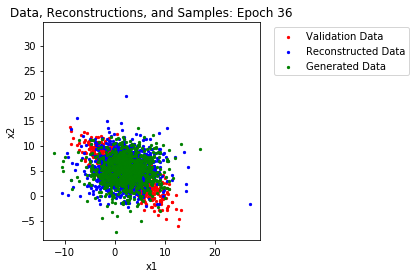

Epoch 37 Average Validation Loss: 7.2968


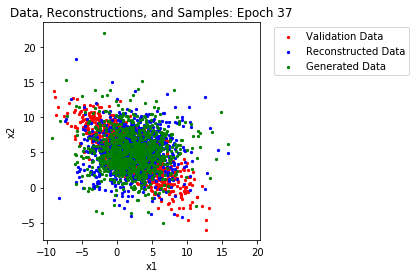

Epoch 38 Average Validation Loss: 7.2877


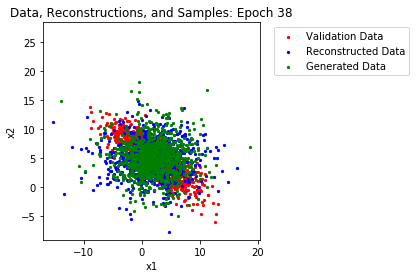

Epoch 39 Average Validation Loss: 7.2827


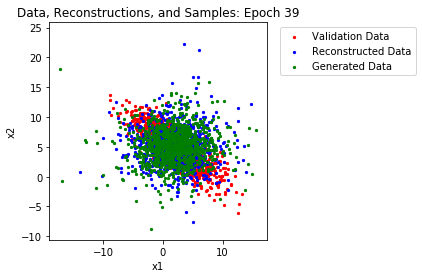

Epoch 40 Average Validation Loss: 7.2836


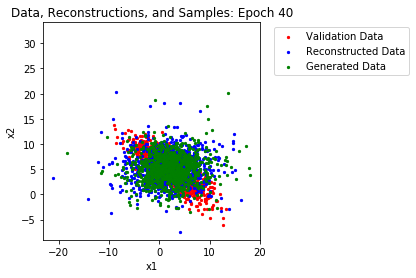

Epoch 41 Average Validation Loss: 7.2967


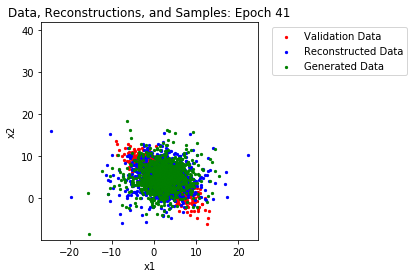

Epoch 42 Average Validation Loss: 7.3185


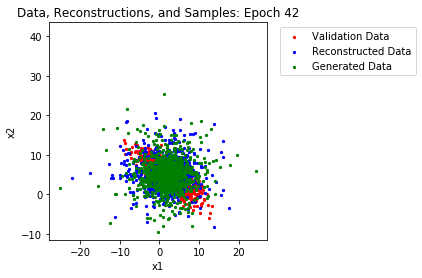

Epoch 43 Average Validation Loss: 7.3062


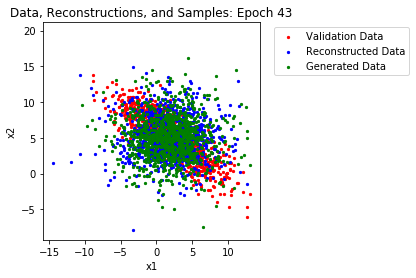

Epoch 44 Average Validation Loss: 7.2742


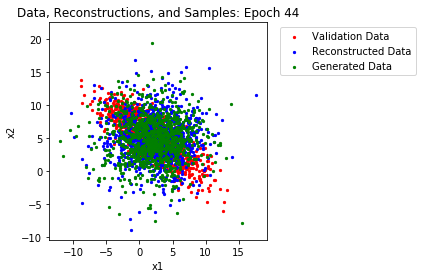

Epoch 45 Average Validation Loss: 7.2839


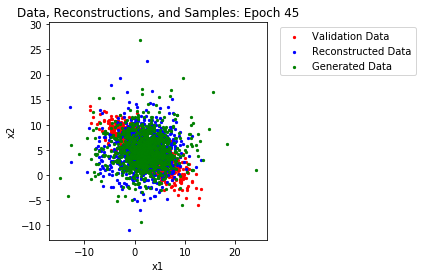

Epoch 46 Average Validation Loss: 7.3039


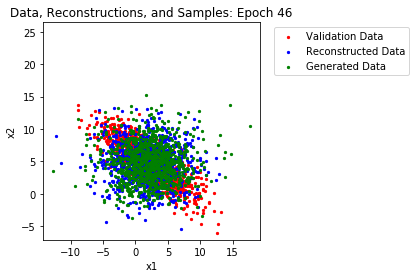

Epoch 47 Average Validation Loss: 7.2675


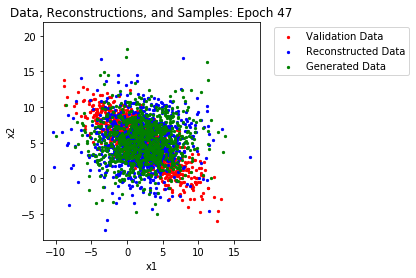

Epoch 48 Average Validation Loss: 7.2563


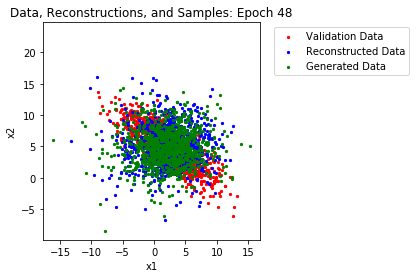

Epoch 49 Average Validation Loss: 7.2596


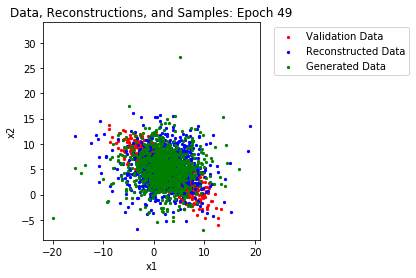

Epoch 50 Average Validation Loss: 7.2591


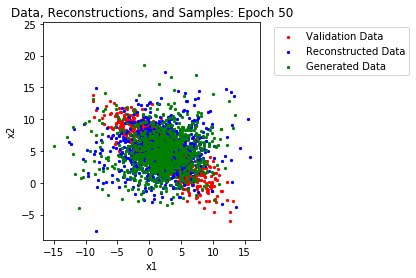

Epoch 51 Average Validation Loss: 7.2724


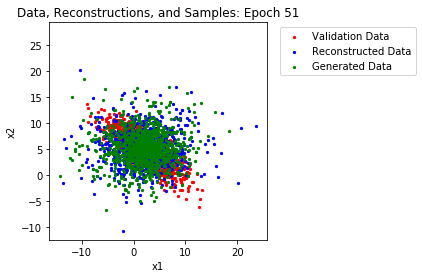

Epoch 52 Average Validation Loss: 7.2787


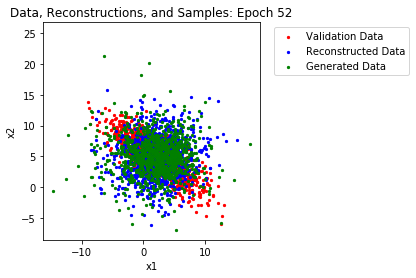

Epoch 53 Average Validation Loss: 7.2728


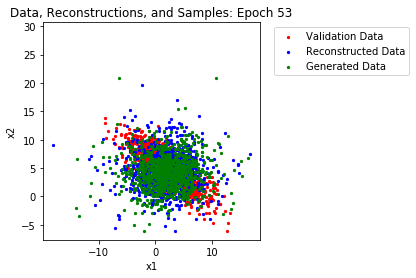

Epoch 54 Average Validation Loss: 7.2714


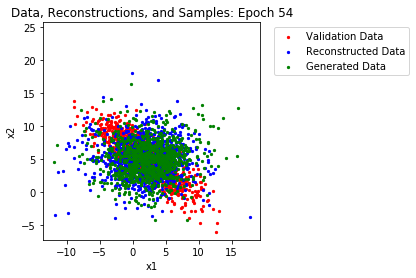

Epoch 55 Average Validation Loss: 7.2645


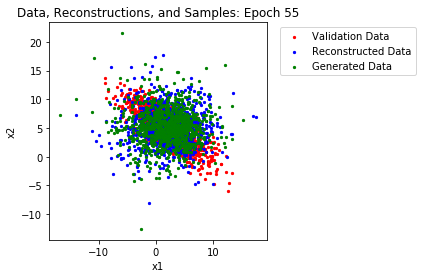

Epoch 56 Average Validation Loss: 7.2660


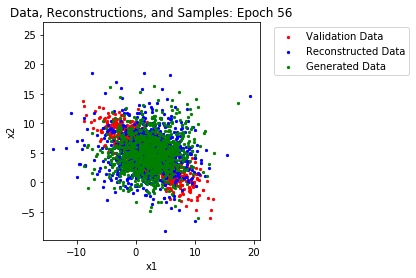

Epoch 57 Average Validation Loss: 7.2722


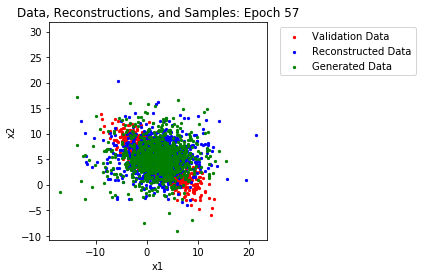

Epoch 58 Average Validation Loss: 7.2789


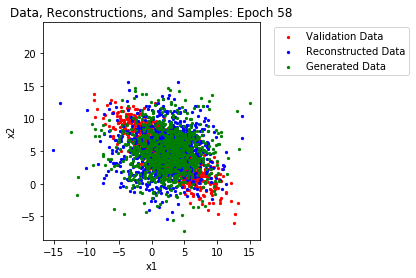

Epoch 59 Average Validation Loss: 7.2784


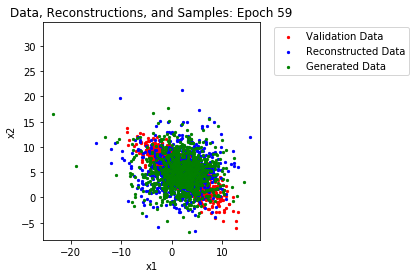

Epoch 60 Average Validation Loss: 7.2758


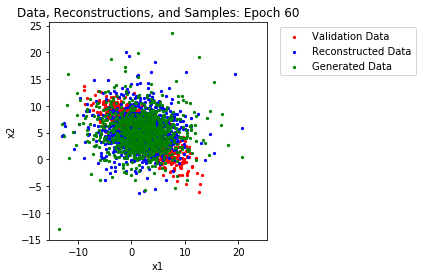

Epoch 61 Average Validation Loss: 7.2813


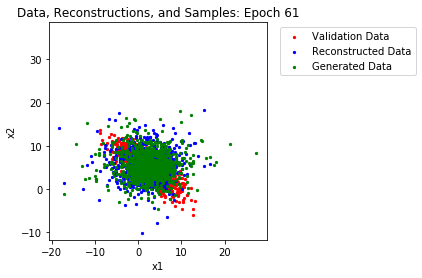

Epoch 62 Average Validation Loss: 7.2665


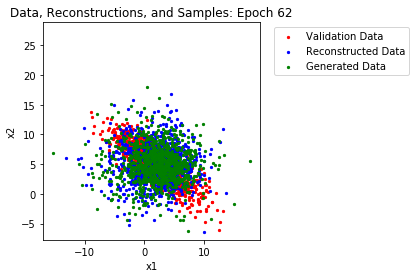

Epoch 63 Average Validation Loss: 7.2531


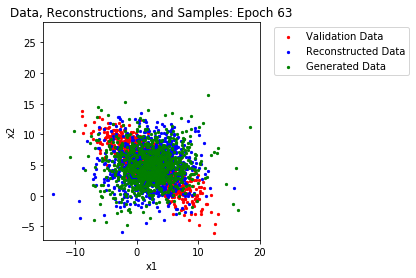

Epoch 64 Average Validation Loss: 7.3148


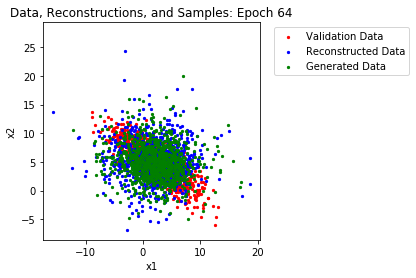

Epoch 65 Average Validation Loss: 7.2706


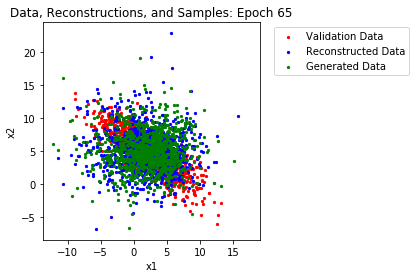

Epoch 66 Average Validation Loss: 7.2630


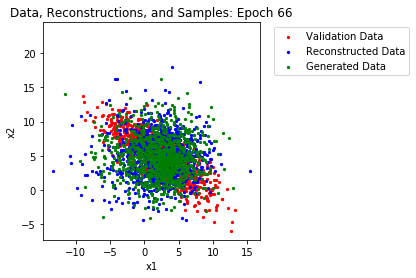

Epoch 67 Average Validation Loss: 7.3058


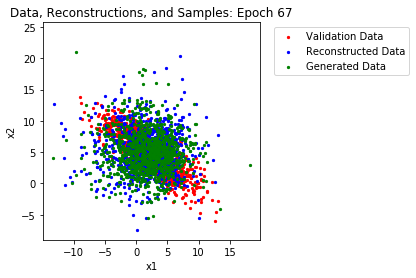

Epoch 68 Average Validation Loss: 7.2485


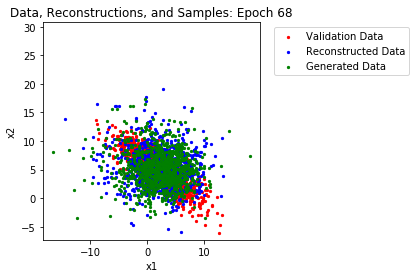

Epoch 69 Average Validation Loss: 7.2844


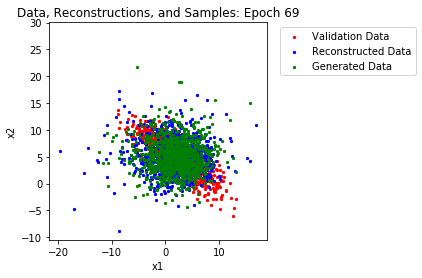

Epoch 70 Average Validation Loss: 7.2905


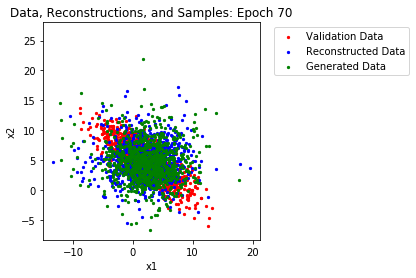

Epoch 71 Average Validation Loss: 7.3036


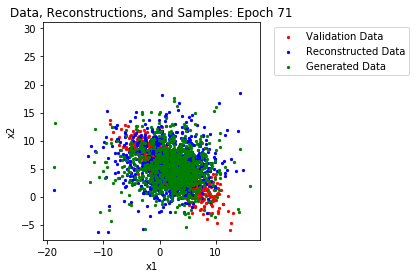

Epoch 72 Average Validation Loss: 7.2662


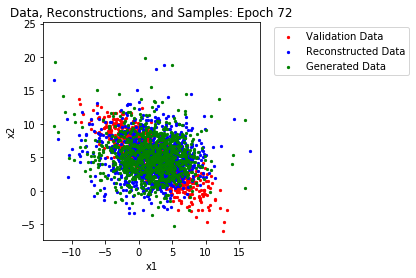

Epoch 73 Average Validation Loss: 7.2779


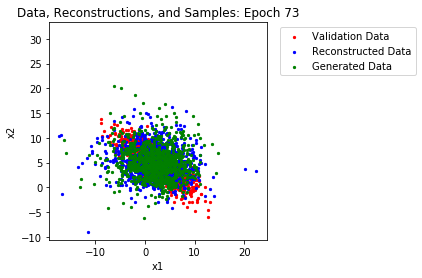

Epoch 74 Average Validation Loss: 7.2929


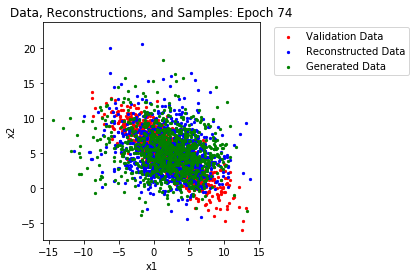

Epoch 75 Average Validation Loss: 7.0710


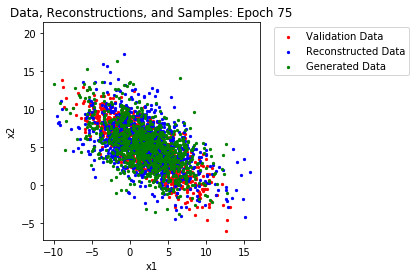

Epoch 76 Average Validation Loss: 6.9539


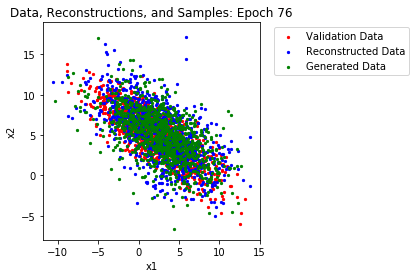

Epoch 77 Average Validation Loss: 6.8506


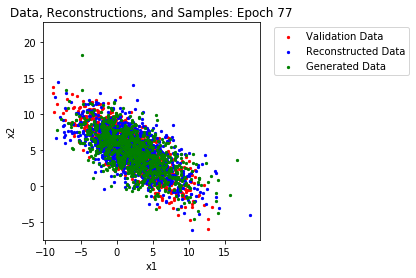

Epoch 78 Average Validation Loss: 6.8722


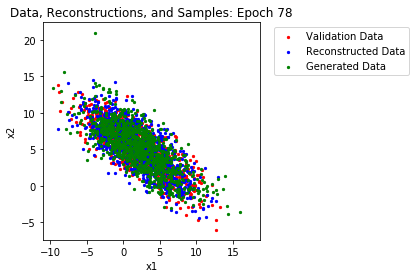

Epoch 79 Average Validation Loss: 6.8737


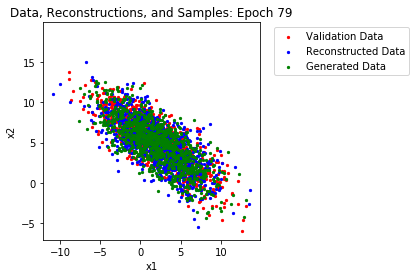

Epoch 80 Average Validation Loss: 6.7915


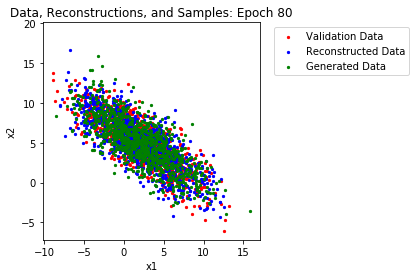

Epoch 81 Average Validation Loss: 6.8772


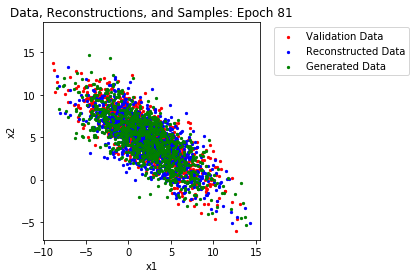

Epoch 82 Average Validation Loss: 6.8365


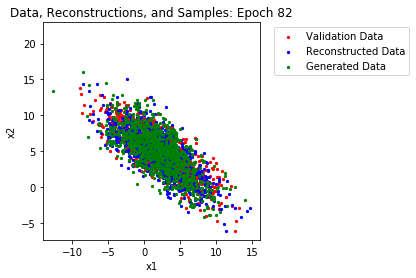

Epoch 83 Average Validation Loss: 6.8363


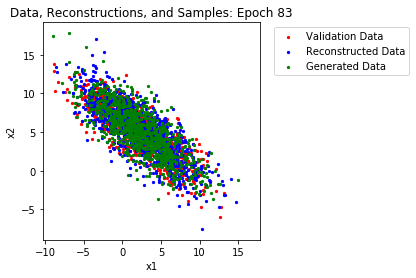

Epoch 84 Average Validation Loss: 6.8128


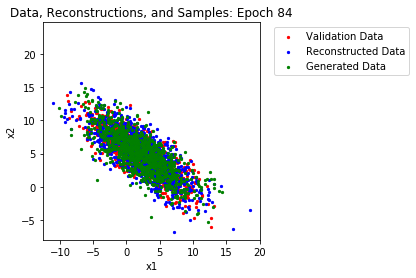

Epoch 85 Average Validation Loss: 6.9381


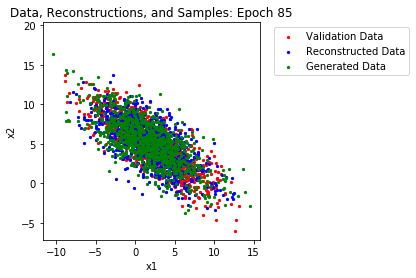

Epoch 86 Average Validation Loss: 6.7908


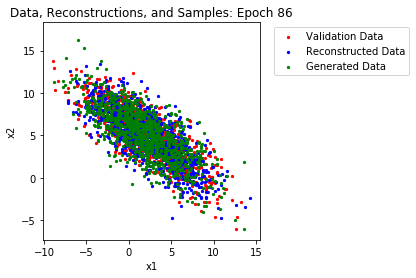

Epoch 87 Average Validation Loss: 6.7793


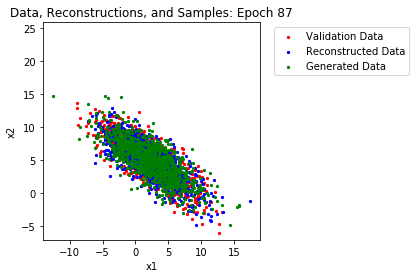

Epoch 88 Average Validation Loss: 6.8024


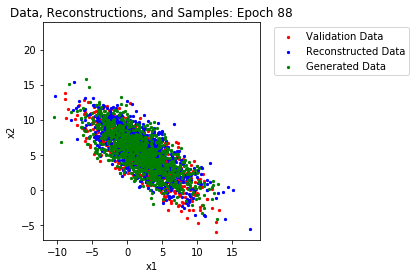

Epoch 89 Average Validation Loss: 6.8014


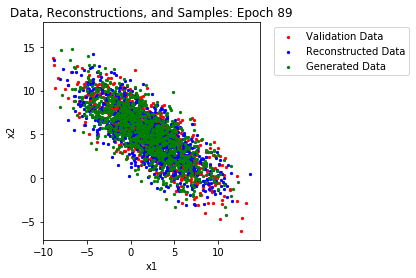

Epoch 90 Average Validation Loss: 6.7390


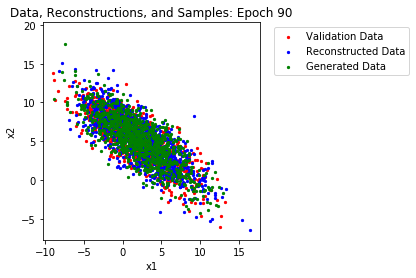

Epoch 91 Average Validation Loss: 6.7692


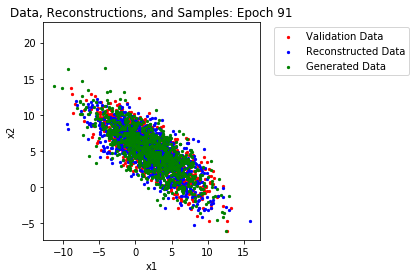

Epoch 92 Average Validation Loss: 6.8223


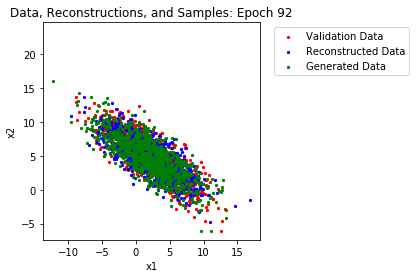

Epoch 93 Average Validation Loss: 6.8675


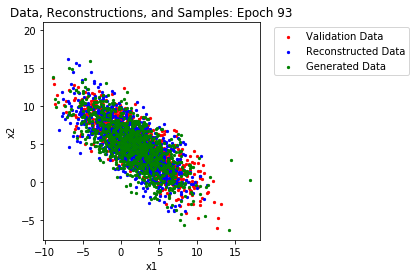

Epoch 94 Average Validation Loss: 6.8469


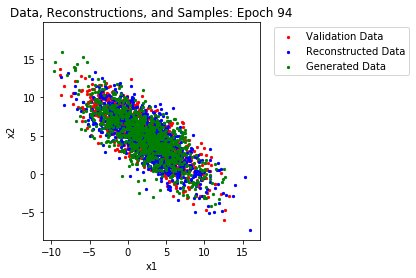

Epoch 95 Average Validation Loss: 6.8191


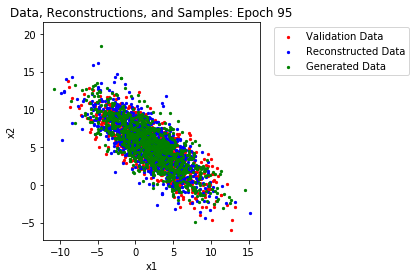

Epoch 96 Average Validation Loss: 6.7555


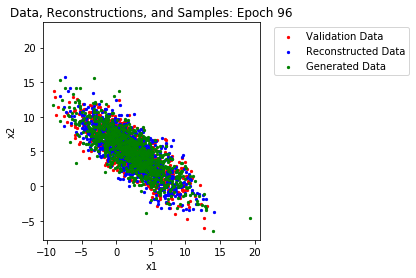

Epoch 97 Average Validation Loss: 6.8467


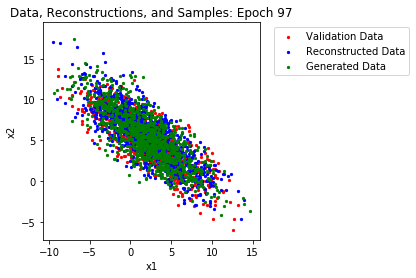

Epoch 98 Average Validation Loss: 6.8597


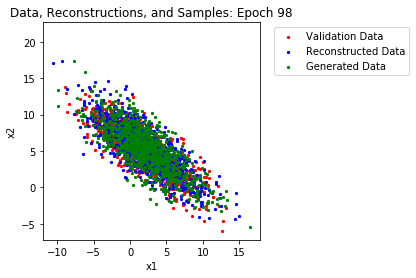

Epoch 99 Average Validation Loss: 6.8217


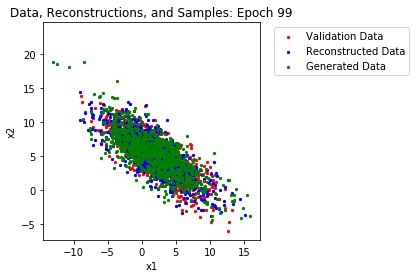

Epoch 100 Average Validation Loss: 6.8257


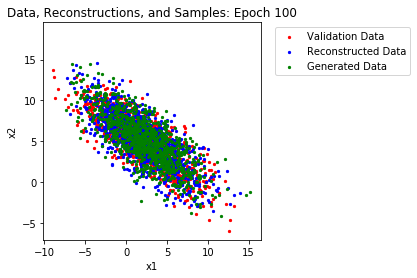

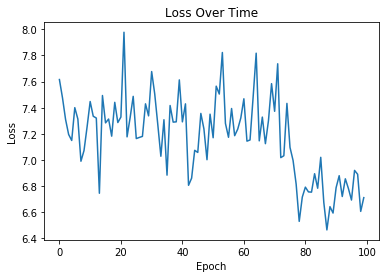

In [14]:
eval(model_list_ex1, loss_list_ex1, valid_loader_ex1, optimizer_ex1)

## 4. Example 2: Learning Two Multivariate Gaussians

The previous example was fairly trivial. Let's see if we can take it further and learn a data distribution which is composed of two independent modes, each a multivariate Gaussian.

### 4.1 Generating Data

In [15]:
# dataset statistics
obs_dim = 2
mu_data_1 = torch.Tensor([2.0, 5.0])
cov_data_1 = torch.Tensor(
    [[15.0, -10.0],
     [-10.0, 10.0]]
)
L_data_1 = torch.cholesky(cov_data_1)

mu_data_2 = torch.Tensor([18.0, 20.0])
cov_data_2 = torch.Tensor(
    [[5.0, -3.0],
     [-3.0, 20.0]]
)
L_data_2 = torch.cholesky(cov_data_2)

# generating training and validation sets
num_train_pts = 10000
num_valid_pts = 1000

eps_train_1 = torch.randn(2, num_train_pts // 2)
eps_train_2 = torch.randn(2, num_train_pts // 2)
eps_valid_1 = torch.randn(2, num_valid_pts // 2)
eps_valid_2 = torch.randn(2, num_valid_pts // 2)

train_data_1 = mu_data_1 + (L_data_1 @ eps_train_1).transpose(-1, -2)
train_data_2 = mu_data_2 + (L_data_2 @ eps_train_2).transpose(-1, -2)
valid_data_1 = mu_data_1 + (L_data_1 @ eps_valid_1).transpose(-1, -2)
valid_data_2 = mu_data_2 + (L_data_2 @ eps_valid_2).transpose(-1, -2)

train_data_ex2 = torch.cat([train_data_1, train_data_2], dim=0)
valid_data_ex2 = torch.cat([valid_data_1, valid_data_2], dim=0)

### 4.2 Training Settings

In [16]:
# hyperparameters
latent_dim = 2
batch_size = 32
epochs = 100
lr = 1e-3  # initial learning rate
step_size = 10  # steps per decay for lr scheduler
gamma = 0.9  # multiplicative decay for lr scheduler

In [17]:
# preparing dataloaders, optimizer, and scheduler
model_ex2 = VAE1(latent_dim, obs_dim)
train_loader_ex2 = torch.utils.data.DataLoader(
    train_data_ex2,
    batch_size=batch_size,
    shuffle=True,
    drop_last=True,
)
valid_loader_ex2 = torch.utils.data.DataLoader(
    valid_data_ex2,
    batch_size=batch_size,
    shuffle=True,
    drop_last=True,
)
optimizer_ex2 = optim.Adam(model_ex2.parameters(), lr=lr)
scheduler_ex2 = optim.lr_scheduler.StepLR(optimizer=optimizer_ex2, step_size=step_size, gamma=gamma)

### 4.3 Training

In [18]:
model_list_ex2, loss_list_ex2 = train(
    model_ex2,
    epochs,
    train_loader_ex2,
    optimizer_ex2,
    scheduler=scheduler_ex2
)

Epoch: 1	Iteration: 10	Loss: 155.2038
Epoch: 1	Iteration: 20	Loss: 166.1010
Epoch: 1	Iteration: 30	Loss: 113.4870
Epoch: 1	Iteration: 40	Loss: 79.5843
Epoch: 1	Iteration: 50	Loss: 90.5618
Epoch: 1	Iteration: 60	Loss: 47.6008
Epoch: 1	Iteration: 70	Loss: 34.8912
Epoch: 1	Iteration: 80	Loss: 32.4774
Epoch: 1	Iteration: 90	Loss: 27.1819
Epoch: 1	Iteration: 100	Loss: 20.3927
Epoch: 1	Iteration: 110	Loss: 20.3941
Epoch: 1	Iteration: 120	Loss: 16.2426
Epoch: 1	Iteration: 130	Loss: 16.7784
Epoch: 1	Iteration: 140	Loss: 13.6380
Epoch: 1	Iteration: 150	Loss: 12.1170
Epoch: 1	Iteration: 160	Loss: 12.4680
Epoch: 1	Iteration: 170	Loss: 12.6404
Epoch: 1	Iteration: 180	Loss: 11.6276
Epoch: 1	Iteration: 190	Loss: 11.1610
Epoch: 1	Iteration: 200	Loss: 11.0252
Epoch: 1	Iteration: 210	Loss: 10.4647
Epoch: 1	Iteration: 220	Loss: 11.1255
Epoch: 1	Iteration: 230	Loss: 11.4243
Epoch: 1	Iteration: 240	Loss: 10.2363
Epoch: 1	Iteration: 250	Loss: 9.5230
Epoch: 1	Iteration: 260	Loss: 10.2911
Epoch: 1	Iteration:

Epoch: 8	Iteration: 2230	Loss: 9.1852
Epoch: 8	Iteration: 2240	Loss: 9.0170
Epoch: 8	Iteration: 2250	Loss: 9.1601
Epoch: 8	Iteration: 2260	Loss: 8.9875
Epoch: 8	Iteration: 2270	Loss: 9.0447
Epoch: 8	Iteration: 2280	Loss: 9.0918
Epoch: 8	Iteration: 2290	Loss: 9.3254
Epoch: 8	Iteration: 2300	Loss: 9.1010
Epoch: 8	Iteration: 2310	Loss: 9.0675
Epoch: 8	Iteration: 2320	Loss: 9.1368
Epoch: 8	Iteration: 2330	Loss: 9.3307
Epoch: 8	Iteration: 2340	Loss: 8.9929
Epoch: 8	Iteration: 2350	Loss: 9.2518
Epoch: 8	Iteration: 2360	Loss: 9.0161
Epoch: 8	Iteration: 2370	Loss: 9.2191
Epoch: 8	Iteration: 2380	Loss: 9.3120
Epoch: 8	Iteration: 2390	Loss: 9.1905
Epoch: 8	Iteration: 2400	Loss: 9.1064
Epoch: 8	Iteration: 2410	Loss: 9.3091
Epoch: 8	Iteration: 2420	Loss: 9.0988
Epoch: 8	Iteration: 2430	Loss: 9.1060
Epoch: 8	Iteration: 2440	Loss: 9.1526
Epoch: 8	Iteration: 2450	Loss: 9.0755
Epoch: 8	Iteration: 2460	Loss: 9.1031
Epoch: 8	Iteration: 2470	Loss: 9.1011
Epoch: 8	Iteration: 2480	Loss: 9.1272
Epoch: 8	Ite

Epoch: 15	Iteration: 4370	Loss: 9.2208
Epoch: 15	Iteration: 4380	Loss: 9.1293
Epoch: 15	Iteration: 4390	Loss: 9.0349
Epoch: 15	Iteration: 4400	Loss: 9.1898
Epoch: 15	Iteration: 4410	Loss: 9.0487
Epoch: 15	Iteration: 4420	Loss: 9.1647
Epoch: 15	Iteration: 4430	Loss: 9.0919
Epoch: 15	Iteration: 4440	Loss: 9.0804
Epoch: 15	Iteration: 4450	Loss: 9.1042
Epoch: 15	Iteration: 4460	Loss: 9.0697
Epoch: 15	Iteration: 4470	Loss: 8.9958
Epoch: 15	Iteration: 4480	Loss: 9.0227
Epoch: 15	Iteration: 4490	Loss: 9.1012
Epoch: 15	Iteration: 4500	Loss: 9.0550
Epoch: 15	Iteration: 4510	Loss: 8.9583
Epoch: 15	Iteration: 4520	Loss: 9.0860
Epoch: 15	Iteration: 4530	Loss: 9.1200
Epoch: 15	Iteration: 4540	Loss: 9.0906
Epoch: 15	Iteration: 4550	Loss: 9.0944
Epoch: 15	Iteration: 4560	Loss: 9.1088
Epoch: 15	Iteration: 4570	Loss: 9.0147
Epoch: 15	Iteration: 4580	Loss: 9.2150
Epoch: 15	Iteration: 4590	Loss: 9.0429
Epoch: 15	Iteration: 4600	Loss: 9.1499
Epoch: 15	Iteration: 4610	Loss: 9.1684
Epoch: 15	Iteration: 4620

Epoch: 21	Iteration: 6520	Loss: 9.0778
Epoch: 21	Iteration: 6530	Loss: 9.1527
Epoch: 21	Iteration: 6540	Loss: 9.2549
Epoch: 21	Iteration: 6550	Loss: 9.1627
Epoch: 22	Iteration: 6560	Loss: 9.0691
Epoch: 22	Iteration: 6570	Loss: 9.0901
Epoch: 22	Iteration: 6580	Loss: 9.0993
Epoch: 22	Iteration: 6590	Loss: 9.0377
Epoch: 22	Iteration: 6600	Loss: 9.0171
Epoch: 22	Iteration: 6610	Loss: 9.0749
Epoch: 22	Iteration: 6620	Loss: 9.0748
Epoch: 22	Iteration: 6630	Loss: 9.1540
Epoch: 22	Iteration: 6640	Loss: 9.0322
Epoch: 22	Iteration: 6650	Loss: 9.0090
Epoch: 22	Iteration: 6660	Loss: 9.0807
Epoch: 22	Iteration: 6670	Loss: 9.2568
Epoch: 22	Iteration: 6680	Loss: 9.1286
Epoch: 22	Iteration: 6690	Loss: 9.2055
Epoch: 22	Iteration: 6700	Loss: 9.0337
Epoch: 22	Iteration: 6710	Loss: 9.1442
Epoch: 22	Iteration: 6720	Loss: 9.0793
Epoch: 22	Iteration: 6730	Loss: 9.2760
Epoch: 22	Iteration: 6740	Loss: 9.1088
Epoch: 22	Iteration: 6750	Loss: 9.2087
Epoch: 22	Iteration: 6760	Loss: 9.1341
Epoch: 22	Iteration: 6770

Epoch: 28	Iteration: 8700	Loss: 8.9706
Epoch: 28	Iteration: 8710	Loss: 9.0211
Epoch: 28	Iteration: 8720	Loss: 9.1299
Epoch: 28	Iteration: 8730	Loss: 9.2482
Epoch: 29	Iteration: 8740	Loss: 9.0861
Epoch: 29	Iteration: 8750	Loss: 9.1133
Epoch: 29	Iteration: 8760	Loss: 9.2109
Epoch: 29	Iteration: 8770	Loss: 9.1720
Epoch: 29	Iteration: 8780	Loss: 9.0806
Epoch: 29	Iteration: 8790	Loss: 9.0313
Epoch: 29	Iteration: 8800	Loss: 9.1759
Epoch: 29	Iteration: 8810	Loss: 9.2291
Epoch: 29	Iteration: 8820	Loss: 8.9210
Epoch: 29	Iteration: 8830	Loss: 9.1458
Epoch: 29	Iteration: 8840	Loss: 9.1118
Epoch: 29	Iteration: 8850	Loss: 9.0698
Epoch: 29	Iteration: 8860	Loss: 9.1089
Epoch: 29	Iteration: 8870	Loss: 9.0429
Epoch: 29	Iteration: 8880	Loss: 9.0922
Epoch: 29	Iteration: 8890	Loss: 9.0637
Epoch: 29	Iteration: 8900	Loss: 9.0750
Epoch: 29	Iteration: 8910	Loss: 9.1805
Epoch: 29	Iteration: 8920	Loss: 9.0581
Epoch: 29	Iteration: 8930	Loss: 9.0975
Epoch: 29	Iteration: 8940	Loss: 8.9729
Epoch: 29	Iteration: 8950

Epoch: 35	Iteration: 10810	Loss: 8.8201
Epoch: 35	Iteration: 10820	Loss: 8.2624
Epoch: 35	Iteration: 10830	Loss: 8.2697
Epoch: 35	Iteration: 10840	Loss: 8.2839
Epoch: 35	Iteration: 10850	Loss: 8.1818
Epoch: 35	Iteration: 10860	Loss: 8.8683
Epoch: 35	Iteration: 10870	Loss: 8.3141
Epoch: 35	Iteration: 10880	Loss: 8.2703
Epoch: 35	Iteration: 10890	Loss: 8.4993
Epoch: 35	Iteration: 10900	Loss: 8.5228
Epoch: 35	Iteration: 10910	Loss: 8.1215
Epoch: 35	Iteration: 10920	Loss: 8.2289
Epoch: 36	Iteration: 10930	Loss: 8.8798
Epoch: 36	Iteration: 10940	Loss: 8.6012
Epoch: 36	Iteration: 10950	Loss: 8.4155
Epoch: 36	Iteration: 10960	Loss: 8.1115
Epoch: 36	Iteration: 10970	Loss: 8.3528
Epoch: 36	Iteration: 10980	Loss: 8.7008
Epoch: 36	Iteration: 10990	Loss: 8.5098
Epoch: 36	Iteration: 11000	Loss: 8.0255
Epoch: 36	Iteration: 11010	Loss: 8.3787
Epoch: 36	Iteration: 11020	Loss: 8.6994
Epoch: 36	Iteration: 11030	Loss: 8.5364
Epoch: 36	Iteration: 11040	Loss: 8.4701
Epoch: 36	Iteration: 11050	Loss: 8.3922


Epoch: 42	Iteration: 12870	Loss: 8.2697
Epoch: 42	Iteration: 12880	Loss: 8.1373
Epoch: 42	Iteration: 12890	Loss: 8.5146
Epoch: 42	Iteration: 12900	Loss: 8.1942
Epoch: 42	Iteration: 12910	Loss: 8.2841
Epoch: 42	Iteration: 12920	Loss: 7.9255
Epoch: 42	Iteration: 12930	Loss: 8.2498
Epoch: 42	Iteration: 12940	Loss: 8.4193
Epoch: 42	Iteration: 12950	Loss: 7.9801
Epoch: 42	Iteration: 12960	Loss: 8.2934
Epoch: 42	Iteration: 12970	Loss: 8.0255
Epoch: 42	Iteration: 12980	Loss: 8.0012
Epoch: 42	Iteration: 12990	Loss: 8.1688
Epoch: 42	Iteration: 13000	Loss: 7.9426
Epoch: 42	Iteration: 13010	Loss: 8.1920
Epoch: 42	Iteration: 13020	Loss: 8.2481
Epoch: 42	Iteration: 13030	Loss: 8.1932
Epoch: 42	Iteration: 13040	Loss: 8.4609
Epoch: 42	Iteration: 13050	Loss: 7.8842
Epoch: 42	Iteration: 13060	Loss: 7.9450
Epoch: 42	Iteration: 13070	Loss: 8.2179
Epoch: 42	Iteration: 13080	Loss: 8.2339
Epoch: 42	Iteration: 13090	Loss: 8.1824
Epoch: 42	Iteration: 13100	Loss: 8.4021
Epoch: 43	Iteration: 13110	Loss: 8.0917


Epoch: 48	Iteration: 14940	Loss: 8.5756
Epoch: 48	Iteration: 14950	Loss: 8.1882
Epoch: 48	Iteration: 14960	Loss: 7.6679
Epoch: 48	Iteration: 14970	Loss: 8.7884
Epoch: 49	Iteration: 14980	Loss: 7.9846
Epoch: 49	Iteration: 14990	Loss: 8.0265
Epoch: 49	Iteration: 15000	Loss: 8.1295
Epoch: 49	Iteration: 15010	Loss: 8.2463
Epoch: 49	Iteration: 15020	Loss: 8.2342
Epoch: 49	Iteration: 15030	Loss: 7.7109
Epoch: 49	Iteration: 15040	Loss: 8.1513
Epoch: 49	Iteration: 15050	Loss: 7.6665
Epoch: 49	Iteration: 15060	Loss: 8.1339
Epoch: 49	Iteration: 15070	Loss: 8.1344
Epoch: 49	Iteration: 15080	Loss: 8.4785
Epoch: 49	Iteration: 15090	Loss: 8.3040
Epoch: 49	Iteration: 15100	Loss: 8.1426
Epoch: 49	Iteration: 15110	Loss: 8.2637
Epoch: 49	Iteration: 15120	Loss: 8.2032
Epoch: 49	Iteration: 15130	Loss: 7.9673
Epoch: 49	Iteration: 15140	Loss: 8.2188
Epoch: 49	Iteration: 15150	Loss: 8.3822
Epoch: 49	Iteration: 15160	Loss: 8.1720
Epoch: 49	Iteration: 15170	Loss: 8.0224
Epoch: 49	Iteration: 15180	Loss: 7.8316


Epoch: 55	Iteration: 17070	Loss: 8.1884
Epoch: 55	Iteration: 17080	Loss: 7.8882
Epoch: 55	Iteration: 17090	Loss: 8.2083
Epoch: 55	Iteration: 17100	Loss: 7.6537
Epoch: 55	Iteration: 17110	Loss: 7.8082
Epoch: 55	Iteration: 17120	Loss: 8.0937
Epoch: 55	Iteration: 17130	Loss: 8.0766
Epoch: 55	Iteration: 17140	Loss: 8.4131
Epoch: 55	Iteration: 17150	Loss: 8.1173
Epoch: 55	Iteration: 17160	Loss: 8.5498
Epoch: 56	Iteration: 17170	Loss: 7.9927
Epoch: 56	Iteration: 17180	Loss: 7.9653
Epoch: 56	Iteration: 17190	Loss: 7.9825
Epoch: 56	Iteration: 17200	Loss: 8.1029
Epoch: 56	Iteration: 17210	Loss: 8.0724
Epoch: 56	Iteration: 17220	Loss: 8.0252
Epoch: 56	Iteration: 17230	Loss: 8.4900
Epoch: 56	Iteration: 17240	Loss: 7.8476
Epoch: 56	Iteration: 17250	Loss: 7.8658
Epoch: 56	Iteration: 17260	Loss: 7.9151
Epoch: 56	Iteration: 17270	Loss: 8.1229
Epoch: 56	Iteration: 17280	Loss: 8.2704
Epoch: 56	Iteration: 17290	Loss: 8.1298
Epoch: 56	Iteration: 17300	Loss: 7.9734
Epoch: 56	Iteration: 17310	Loss: 8.0604


Epoch: 62	Iteration: 19120	Loss: 8.2900
Epoch: 62	Iteration: 19130	Loss: 8.0266
Epoch: 62	Iteration: 19140	Loss: 7.8805
Epoch: 62	Iteration: 19150	Loss: 8.0347
Epoch: 62	Iteration: 19160	Loss: 7.9579
Epoch: 62	Iteration: 19170	Loss: 8.1591
Epoch: 62	Iteration: 19180	Loss: 8.2685
Epoch: 62	Iteration: 19190	Loss: 7.9571
Epoch: 62	Iteration: 19200	Loss: 8.0554
Epoch: 62	Iteration: 19210	Loss: 8.5178
Epoch: 62	Iteration: 19220	Loss: 7.9704
Epoch: 62	Iteration: 19230	Loss: 8.1788
Epoch: 62	Iteration: 19240	Loss: 8.1794
Epoch: 62	Iteration: 19250	Loss: 7.7183
Epoch: 62	Iteration: 19260	Loss: 8.2262
Epoch: 62	Iteration: 19270	Loss: 8.0577
Epoch: 62	Iteration: 19280	Loss: 7.9531
Epoch: 62	Iteration: 19290	Loss: 7.7581
Epoch: 62	Iteration: 19300	Loss: 7.8091
Epoch: 62	Iteration: 19310	Loss: 7.7024
Epoch: 62	Iteration: 19320	Loss: 8.6272
Epoch: 62	Iteration: 19330	Loss: 8.4119
Epoch: 62	Iteration: 19340	Loss: 8.1411
Epoch: 63	Iteration: 19350	Loss: 8.2932
Epoch: 63	Iteration: 19360	Loss: 8.1513


Epoch: 68	Iteration: 21210	Loss: 7.9075
Epoch: 69	Iteration: 21220	Loss: 7.7594
Epoch: 69	Iteration: 21230	Loss: 8.0274
Epoch: 69	Iteration: 21240	Loss: 8.0402
Epoch: 69	Iteration: 21250	Loss: 8.0433
Epoch: 69	Iteration: 21260	Loss: 8.3522
Epoch: 69	Iteration: 21270	Loss: 7.9200
Epoch: 69	Iteration: 21280	Loss: 7.9822
Epoch: 69	Iteration: 21290	Loss: 7.7868
Epoch: 69	Iteration: 21300	Loss: 8.3941
Epoch: 69	Iteration: 21310	Loss: 8.0461
Epoch: 69	Iteration: 21320	Loss: 8.2040
Epoch: 69	Iteration: 21330	Loss: 8.5634
Epoch: 69	Iteration: 21340	Loss: 8.2450
Epoch: 69	Iteration: 21350	Loss: 8.1432
Epoch: 69	Iteration: 21360	Loss: 7.9500
Epoch: 69	Iteration: 21370	Loss: 8.2038
Epoch: 69	Iteration: 21380	Loss: 8.3898
Epoch: 69	Iteration: 21390	Loss: 8.0197
Epoch: 69	Iteration: 21400	Loss: 8.0779
Epoch: 69	Iteration: 21410	Loss: 8.1389
Epoch: 69	Iteration: 21420	Loss: 8.1803
Epoch: 69	Iteration: 21430	Loss: 8.2731
Epoch: 69	Iteration: 21440	Loss: 7.9791
Epoch: 69	Iteration: 21450	Loss: 7.7422


Epoch: 75	Iteration: 23330	Loss: 8.2918
Epoch: 75	Iteration: 23340	Loss: 8.2462
Epoch: 75	Iteration: 23350	Loss: 8.1502
Epoch: 75	Iteration: 23360	Loss: 8.0818
Epoch: 75	Iteration: 23370	Loss: 7.9709
Epoch: 75	Iteration: 23380	Loss: 7.7066
Epoch: 75	Iteration: 23390	Loss: 8.7802
Epoch: 75	Iteration: 23400	Loss: 7.7296
Epoch: 76	Iteration: 23410	Loss: 8.0595
Epoch: 76	Iteration: 23420	Loss: 7.9465
Epoch: 76	Iteration: 23430	Loss: 8.4737
Epoch: 76	Iteration: 23440	Loss: 8.0512
Epoch: 76	Iteration: 23450	Loss: 8.0151
Epoch: 76	Iteration: 23460	Loss: 8.3426
Epoch: 76	Iteration: 23470	Loss: 8.0922
Epoch: 76	Iteration: 23480	Loss: 8.3867
Epoch: 76	Iteration: 23490	Loss: 8.2633
Epoch: 76	Iteration: 23500	Loss: 7.8213
Epoch: 76	Iteration: 23510	Loss: 7.8269
Epoch: 76	Iteration: 23520	Loss: 7.8268
Epoch: 76	Iteration: 23530	Loss: 8.0213
Epoch: 76	Iteration: 23540	Loss: 7.9719
Epoch: 76	Iteration: 23550	Loss: 7.9823
Epoch: 76	Iteration: 23560	Loss: 7.4564
Epoch: 76	Iteration: 23570	Loss: 8.3356


Epoch: 82	Iteration: 25470	Loss: 8.1348
Epoch: 82	Iteration: 25480	Loss: 7.9448
Epoch: 82	Iteration: 25490	Loss: 7.6959
Epoch: 82	Iteration: 25500	Loss: 8.2566
Epoch: 82	Iteration: 25510	Loss: 8.4641
Epoch: 82	Iteration: 25520	Loss: 8.0249
Epoch: 82	Iteration: 25530	Loss: 7.7912
Epoch: 82	Iteration: 25540	Loss: 8.0948
Epoch: 82	Iteration: 25550	Loss: 8.2159
Epoch: 82	Iteration: 25560	Loss: 7.9764
Epoch: 82	Iteration: 25570	Loss: 8.3135
Epoch: 82	Iteration: 25580	Loss: 7.8428
Epoch: 83	Iteration: 25590	Loss: 8.2060
Epoch: 83	Iteration: 25600	Loss: 8.1218
Epoch: 83	Iteration: 25610	Loss: 8.3382
Epoch: 83	Iteration: 25620	Loss: 7.8910
Epoch: 83	Iteration: 25630	Loss: 8.2704
Epoch: 83	Iteration: 25640	Loss: 8.1362
Epoch: 83	Iteration: 25650	Loss: 8.3650
Epoch: 83	Iteration: 25660	Loss: 8.0058
Epoch: 83	Iteration: 25670	Loss: 7.7719
Epoch: 83	Iteration: 25680	Loss: 7.8615
Epoch: 83	Iteration: 25690	Loss: 8.0702
Epoch: 83	Iteration: 25700	Loss: 7.7428
Epoch: 83	Iteration: 25710	Loss: 7.3320


Epoch: 89	Iteration: 27560	Loss: 7.9564
Epoch: 89	Iteration: 27570	Loss: 8.0193
Epoch: 89	Iteration: 27580	Loss: 7.9109
Epoch: 89	Iteration: 27590	Loss: 8.0775
Epoch: 89	Iteration: 27600	Loss: 7.7106
Epoch: 89	Iteration: 27610	Loss: 7.9018
Epoch: 89	Iteration: 27620	Loss: 7.9414
Epoch: 89	Iteration: 27630	Loss: 8.1849
Epoch: 89	Iteration: 27640	Loss: 7.9085
Epoch: 89	Iteration: 27650	Loss: 7.6103
Epoch: 89	Iteration: 27660	Loss: 8.1324
Epoch: 89	Iteration: 27670	Loss: 7.6786
Epoch: 89	Iteration: 27680	Loss: 8.3708
Epoch: 89	Iteration: 27690	Loss: 8.0153
Epoch: 89	Iteration: 27700	Loss: 7.7047
Epoch: 89	Iteration: 27710	Loss: 7.8330
Epoch: 89	Iteration: 27720	Loss: 7.8771
Epoch: 89	Iteration: 27730	Loss: 7.8170
Epoch: 89	Iteration: 27740	Loss: 7.6315
Epoch: 89	Iteration: 27750	Loss: 7.8001
Epoch: 89	Iteration: 27760	Loss: 8.0079
Epoch: 90	Iteration: 27770	Loss: 8.1994
Epoch: 90	Iteration: 27780	Loss: 8.3168
Epoch: 90	Iteration: 27790	Loss: 8.0804
Epoch: 90	Iteration: 27800	Loss: 7.7190


Epoch: 96	Iteration: 29680	Loss: 7.8031
Epoch: 96	Iteration: 29690	Loss: 8.0980
Epoch: 96	Iteration: 29700	Loss: 8.2313
Epoch: 96	Iteration: 29710	Loss: 8.0850
Epoch: 96	Iteration: 29720	Loss: 7.8225
Epoch: 96	Iteration: 29730	Loss: 7.7922
Epoch: 96	Iteration: 29740	Loss: 7.9556
Epoch: 96	Iteration: 29750	Loss: 8.0596
Epoch: 96	Iteration: 29760	Loss: 8.2092
Epoch: 96	Iteration: 29770	Loss: 8.0744
Epoch: 96	Iteration: 29780	Loss: 8.4167
Epoch: 96	Iteration: 29790	Loss: 8.2545
Epoch: 96	Iteration: 29800	Loss: 8.3896
Epoch: 96	Iteration: 29810	Loss: 7.9167
Epoch: 96	Iteration: 29820	Loss: 8.1119
Epoch: 96	Iteration: 29830	Loss: 7.9018
Epoch: 96	Iteration: 29840	Loss: 8.0851
Epoch: 96	Iteration: 29850	Loss: 8.4405
Epoch: 96	Iteration: 29860	Loss: 8.0082
Epoch: 96	Iteration: 29870	Loss: 8.1425
Epoch: 96	Iteration: 29880	Loss: 8.0416
Epoch: 96	Iteration: 29890	Loss: 7.9731
Epoch: 96	Iteration: 29900	Loss: 8.1616
Epoch: 96	Iteration: 29910	Loss: 8.3389
Epoch: 96	Iteration: 29920	Loss: 8.0066


### 4.4 Evaluation

After evaluating the models, you can see that it is even able to learn multimodal distributions even though the decoder and encoder are unimodal. How? Recall that we are only modeling *conditional* distributions as unimodal (the encoder and decoder). This means that *given* a particular data point, we can recover an isotropic Gaussian distribution over the latent space, and similarly, *given* a particular latent variable, we can recover an isotropic Gaussian distibution over the data space.

If we draw data from one of the modes, it's likely to map to one of two modes in the latent space. If we draw data from the other mode, it will map to the other mode in the latent space. Similarly, any points drawn from the corresponding modes in latent space will yield the original modes in data space. Below, you can clearly see two distinct latent modes developing. We can see that roughly, the two modes in latent space are axis-aligned (isotropic) and they are in the range of the standard normal Gaussian (near zero-mean and datapoints not extending too far from the mean). This demonstrates the regularizing effect of the standard normal prior. Finally, notice how the latent space is all pretty much compressed to a single line. This suggests that the latent information is all contained in one dimension rather than two! We can draw parallels to interpreting PCA and the latent space of VAEs here.

We also see that it's quite difficult to specifically generate data in one of the modes or the other. We can only sample from the standard normal and decode the noise many times to retrieve two modes overall in the resulting distribution. The CVAE does a good job of addressing this.

Epoch 1 Average Validation Loss: 9.8781


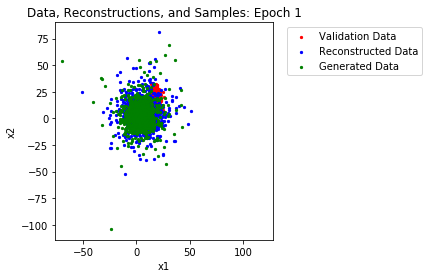

Epoch 2 Average Validation Loss: 9.5574


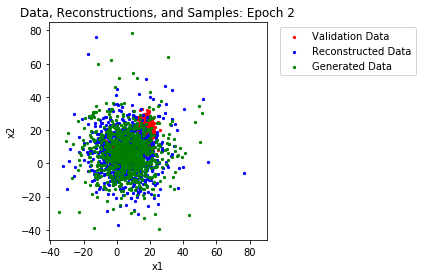

Epoch 3 Average Validation Loss: 9.2783


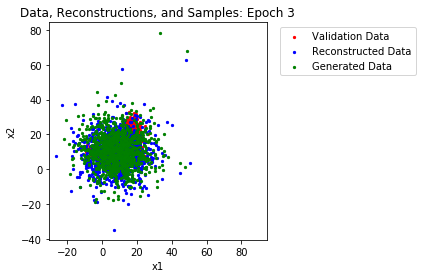

Epoch 4 Average Validation Loss: 9.1705


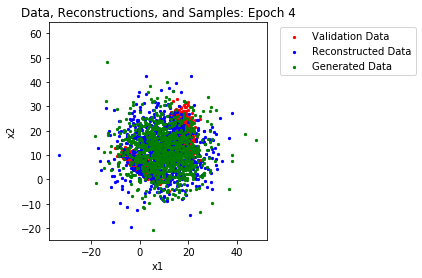

Epoch 5 Average Validation Loss: 9.1692


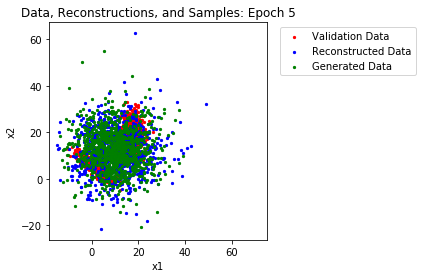

Epoch 6 Average Validation Loss: 9.1620


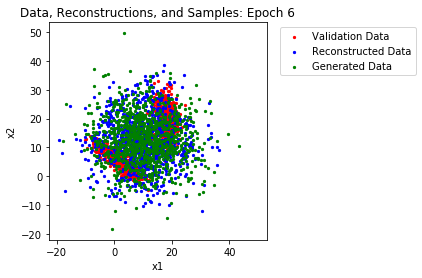

Epoch 7 Average Validation Loss: 9.1555


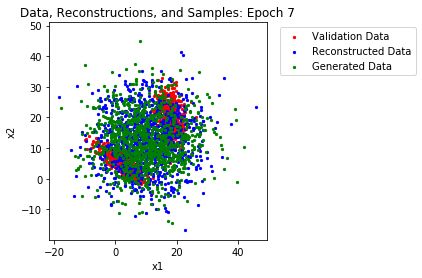

Epoch 8 Average Validation Loss: 9.1528


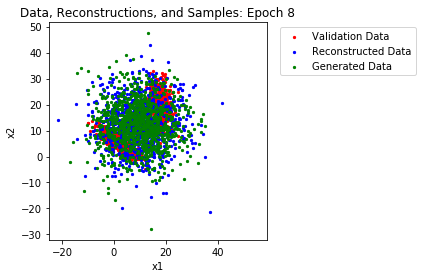

Epoch 9 Average Validation Loss: 9.1522


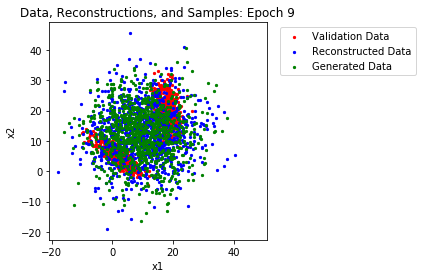

Epoch 10 Average Validation Loss: 9.1427


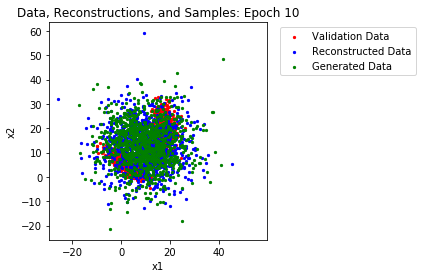

Epoch 11 Average Validation Loss: 9.1476


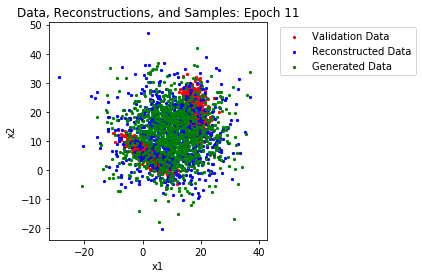

Epoch 12 Average Validation Loss: 9.1470


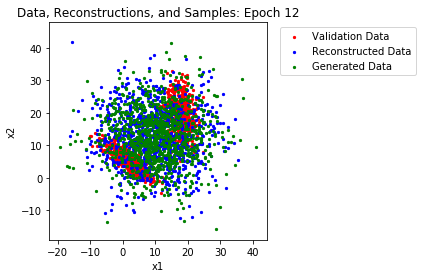

Epoch 13 Average Validation Loss: 9.1440


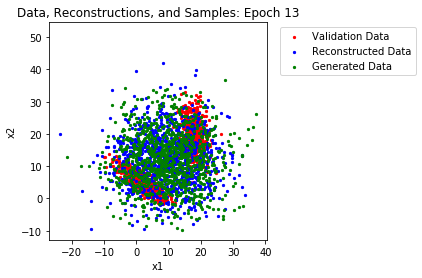

Epoch 14 Average Validation Loss: 9.1389


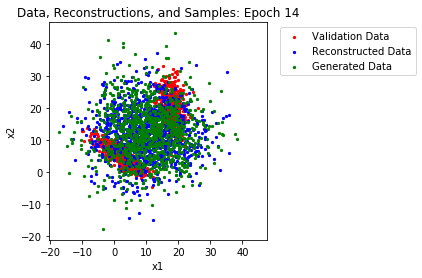

Epoch 15 Average Validation Loss: 9.1406


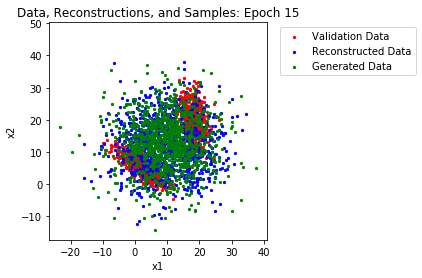

Epoch 16 Average Validation Loss: 9.1407


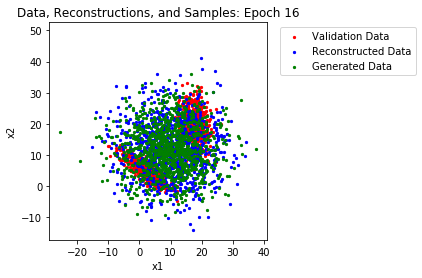

Epoch 17 Average Validation Loss: 9.1353


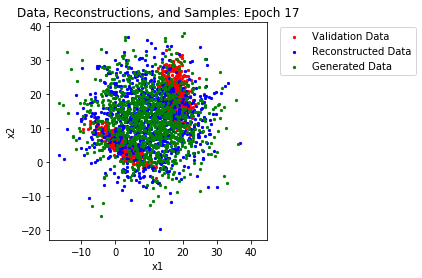

Epoch 18 Average Validation Loss: 9.1398


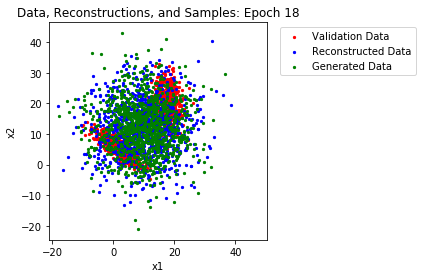

Epoch 19 Average Validation Loss: 9.1395


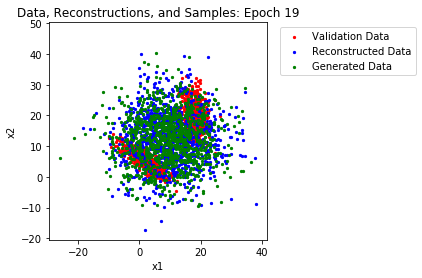

Epoch 20 Average Validation Loss: 9.1346


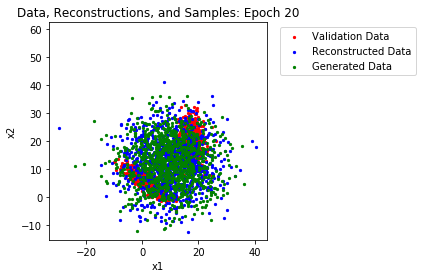

Epoch 21 Average Validation Loss: 9.1348


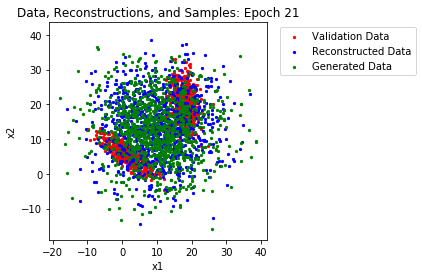

Epoch 22 Average Validation Loss: 9.1397


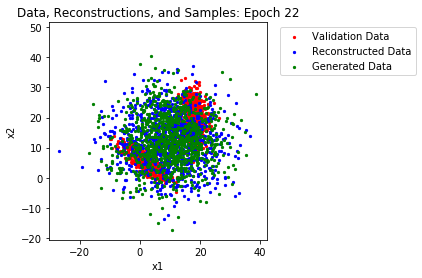

Epoch 23 Average Validation Loss: 9.1377


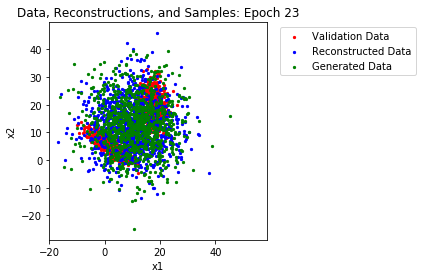

Epoch 24 Average Validation Loss: 9.1423


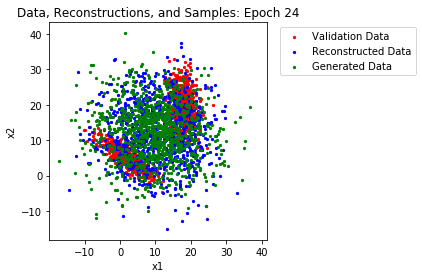

Epoch 25 Average Validation Loss: 9.1398


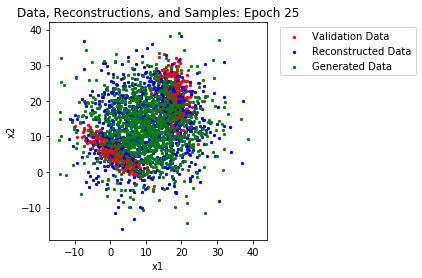

Epoch 26 Average Validation Loss: 9.1376


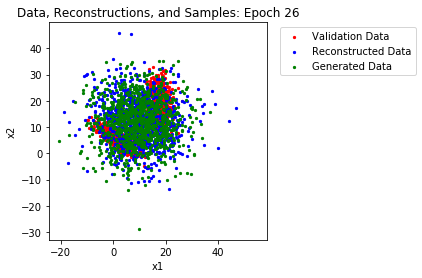

Epoch 27 Average Validation Loss: 9.1355


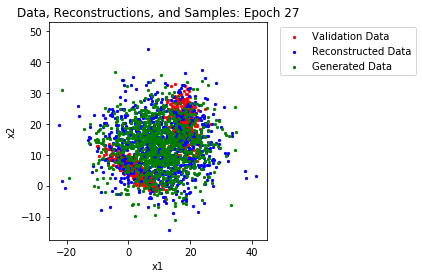

Epoch 28 Average Validation Loss: 9.1367


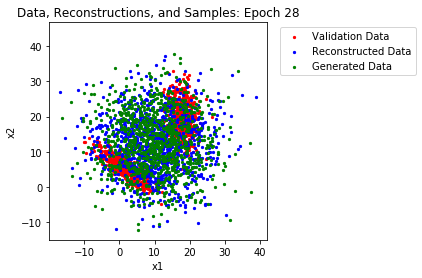

Epoch 29 Average Validation Loss: 9.1302


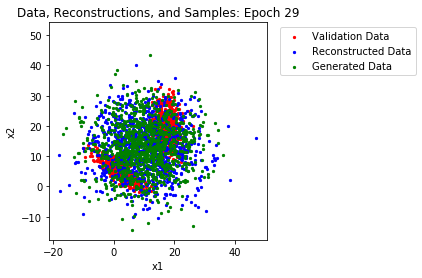

Epoch 30 Average Validation Loss: 9.1400


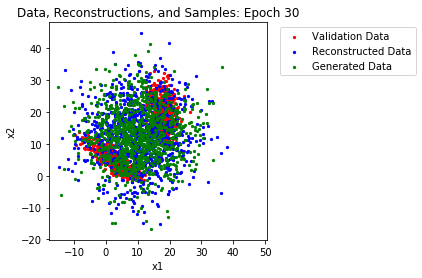

Epoch 31 Average Validation Loss: 9.1345


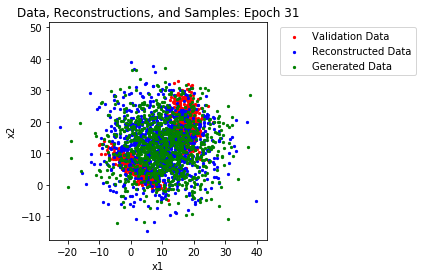

Epoch 32 Average Validation Loss: 9.1292


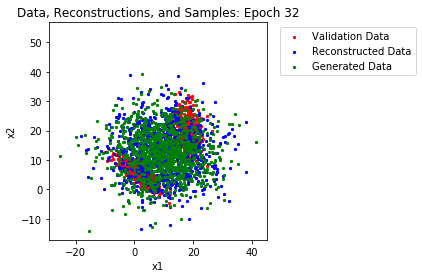

Epoch 33 Average Validation Loss: 9.1442


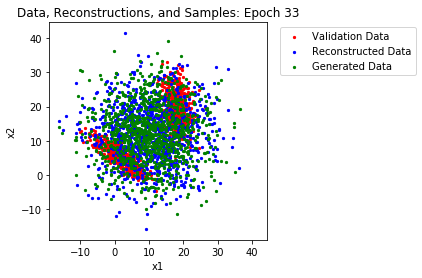

Epoch 34 Average Validation Loss: 8.6901


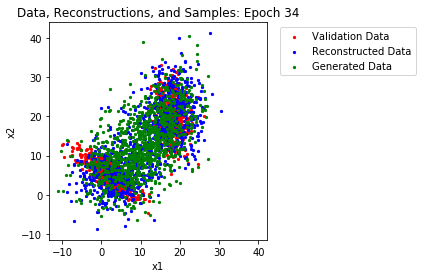

Epoch 35 Average Validation Loss: 8.4546


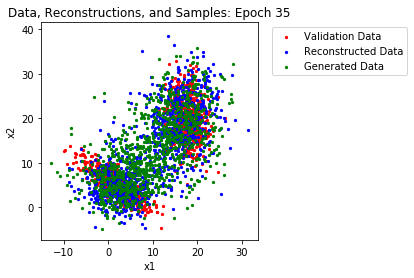

Epoch 36 Average Validation Loss: 8.2833


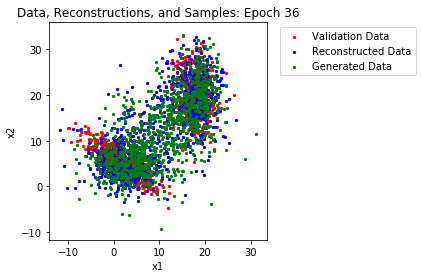

Epoch 37 Average Validation Loss: 8.2386


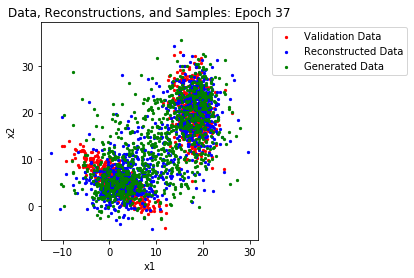

Epoch 38 Average Validation Loss: 8.1933


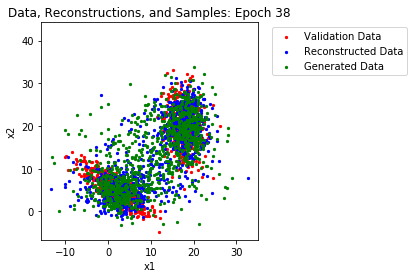

Epoch 39 Average Validation Loss: 8.1888


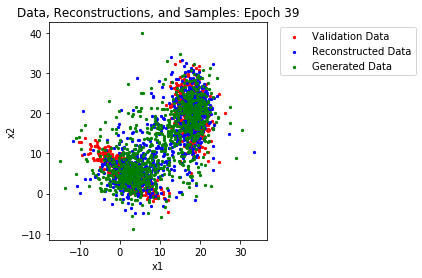

Epoch 40 Average Validation Loss: 8.1959


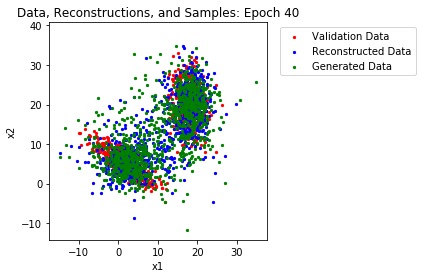

Epoch 41 Average Validation Loss: 8.1958


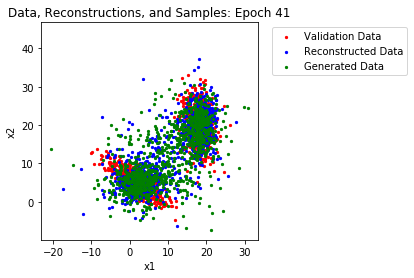

Epoch 42 Average Validation Loss: 8.1704


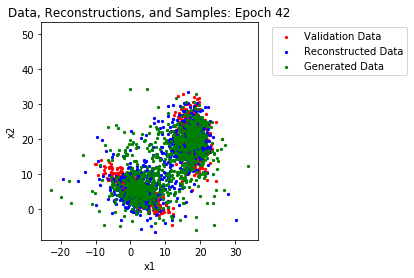

Epoch 43 Average Validation Loss: 8.1576


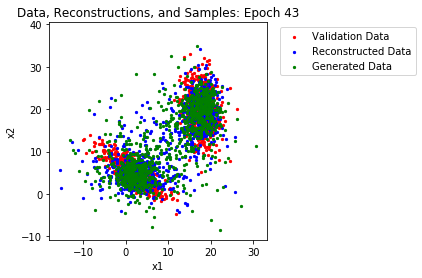

Epoch 44 Average Validation Loss: 8.1907


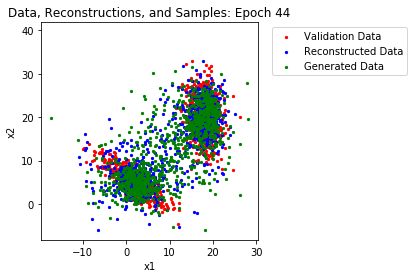

Epoch 45 Average Validation Loss: 8.1124


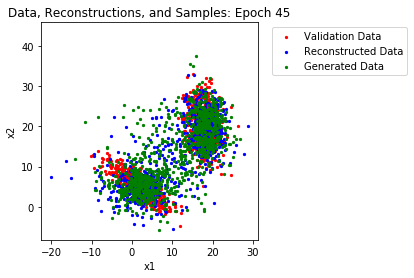

Epoch 46 Average Validation Loss: 8.1111


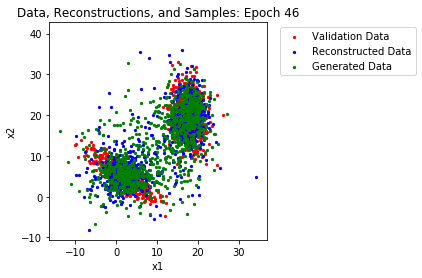

Epoch 47 Average Validation Loss: 8.1206


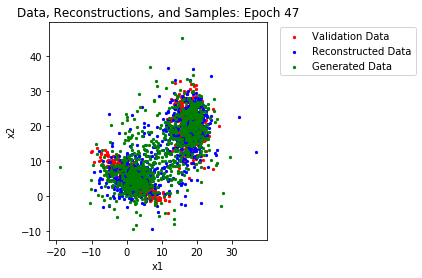

Epoch 48 Average Validation Loss: 8.1236


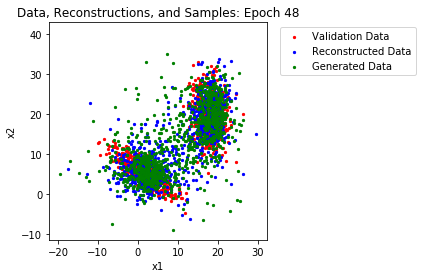

Epoch 49 Average Validation Loss: 8.0664


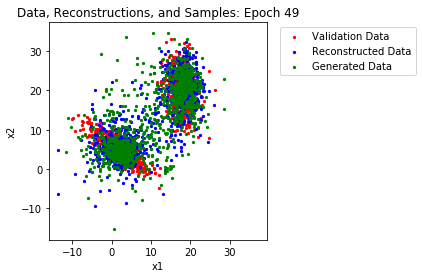

Epoch 50 Average Validation Loss: 8.1174


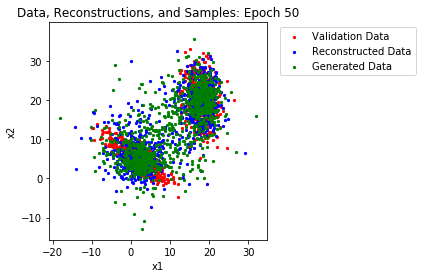

Epoch 51 Average Validation Loss: 8.1415


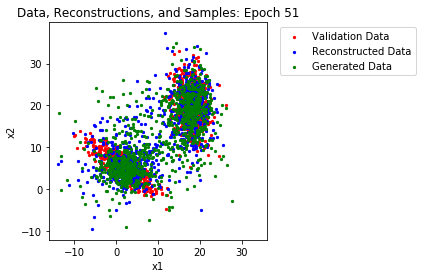

Epoch 52 Average Validation Loss: 8.1393


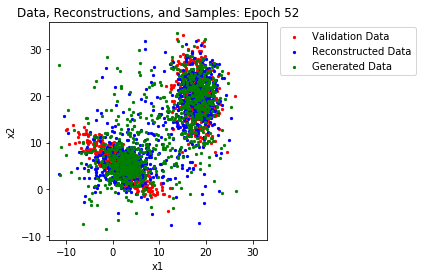

Epoch 53 Average Validation Loss: 8.1559


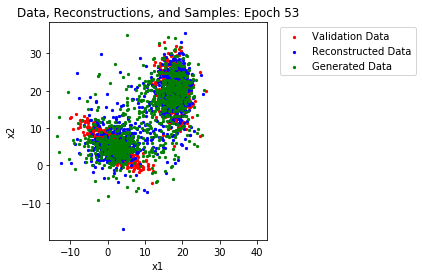

Epoch 54 Average Validation Loss: 8.1256


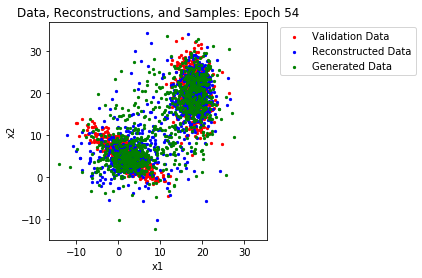

Epoch 55 Average Validation Loss: 8.0976


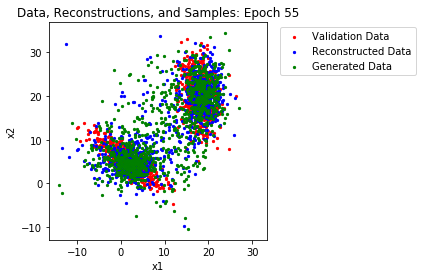

Epoch 56 Average Validation Loss: 8.0472


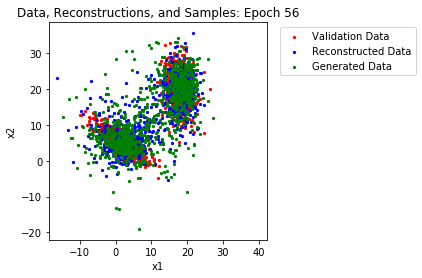

Epoch 57 Average Validation Loss: 8.0962


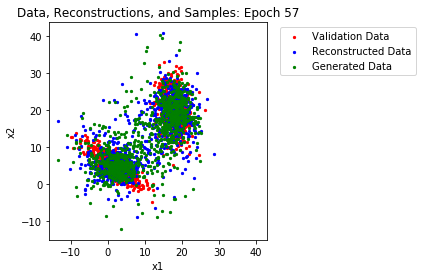

Epoch 58 Average Validation Loss: 8.1067


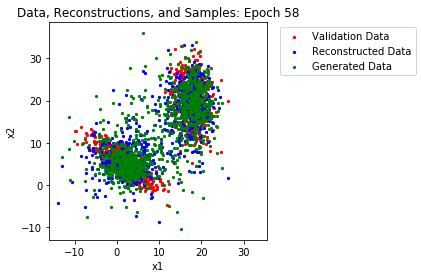

Epoch 59 Average Validation Loss: 8.1058


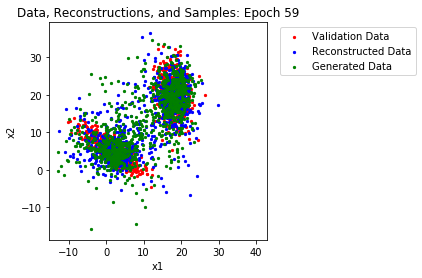

Epoch 60 Average Validation Loss: 8.0593


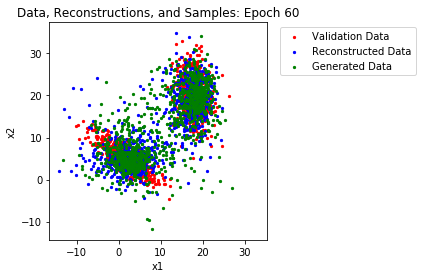

Epoch 61 Average Validation Loss: 8.0875


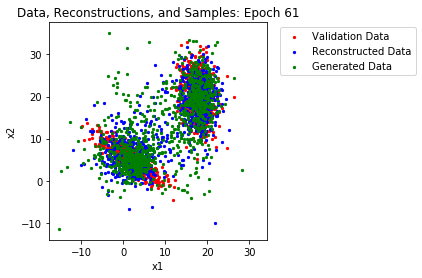

Epoch 62 Average Validation Loss: 8.0155


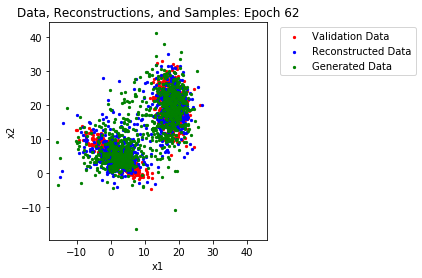

Epoch 63 Average Validation Loss: 8.1058


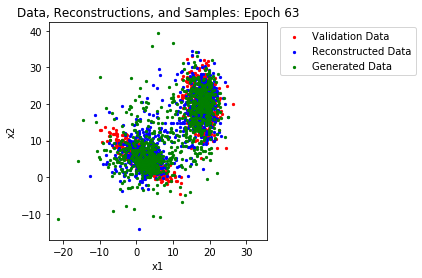

Epoch 64 Average Validation Loss: 8.0554


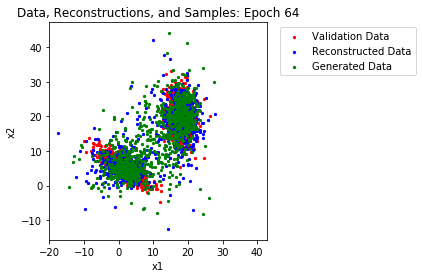

Epoch 65 Average Validation Loss: 8.1206


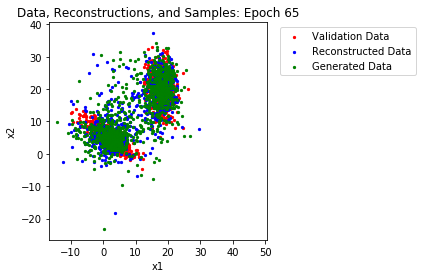

Epoch 66 Average Validation Loss: 8.0514


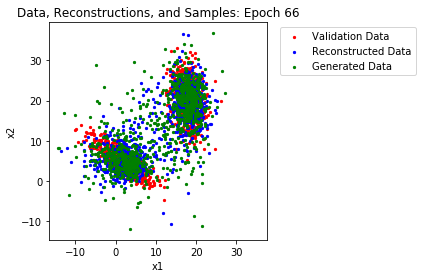

Epoch 67 Average Validation Loss: 8.0957


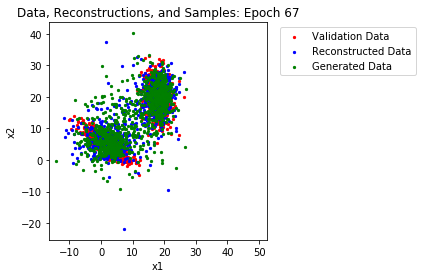

Epoch 68 Average Validation Loss: 8.0894


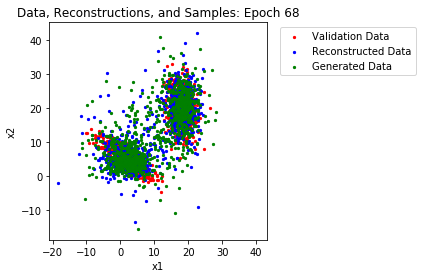

Epoch 69 Average Validation Loss: 8.0866


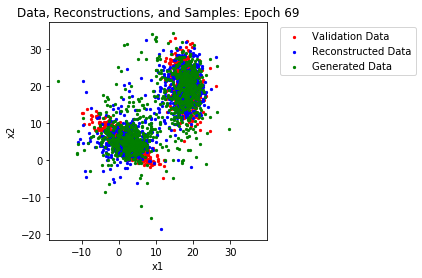

Epoch 70 Average Validation Loss: 8.0512


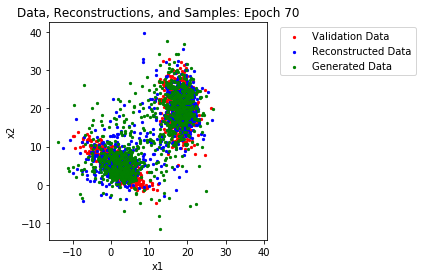

Epoch 71 Average Validation Loss: 8.1210


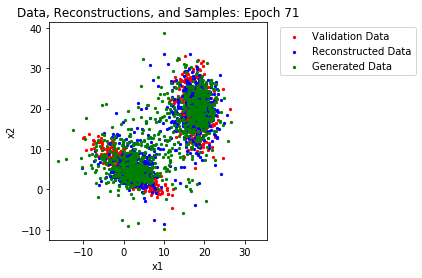

Epoch 72 Average Validation Loss: 8.0628


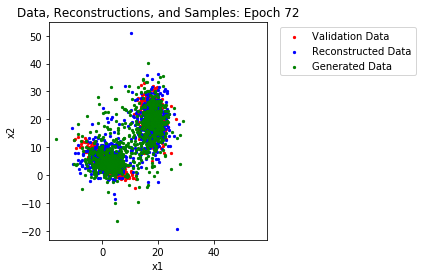

Epoch 73 Average Validation Loss: 8.0374


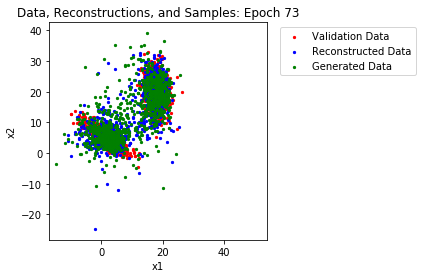

Epoch 74 Average Validation Loss: 8.0871


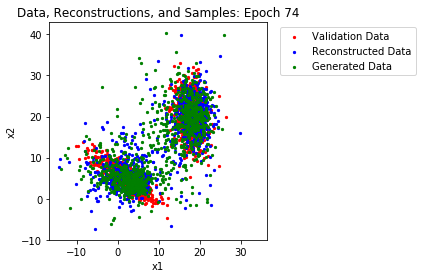

Epoch 75 Average Validation Loss: 8.0575


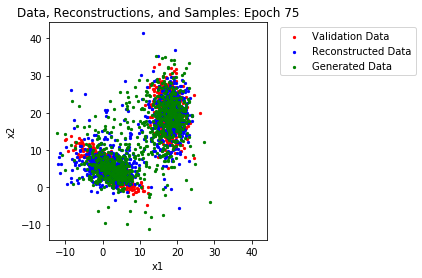

Epoch 76 Average Validation Loss: 8.0672


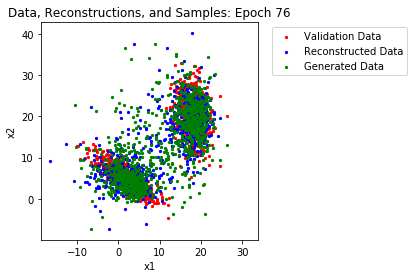

Epoch 77 Average Validation Loss: 8.0546


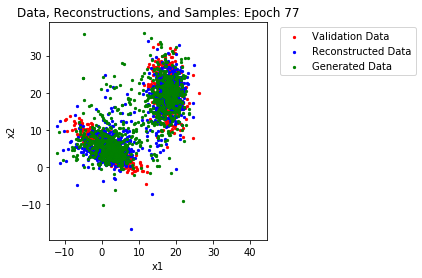

Epoch 78 Average Validation Loss: 8.1031


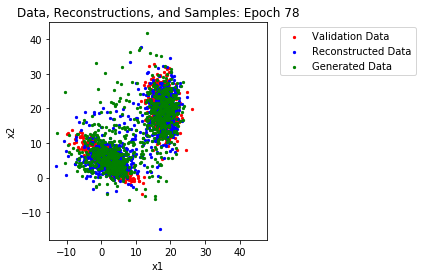

Epoch 79 Average Validation Loss: 8.0381


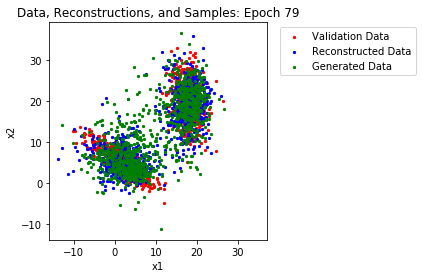

Epoch 80 Average Validation Loss: 8.0302


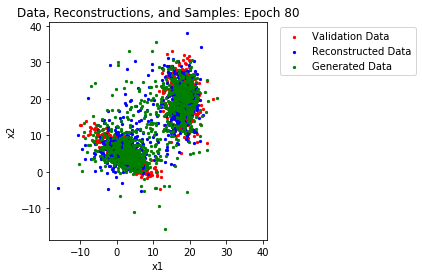

Epoch 81 Average Validation Loss: 8.1054


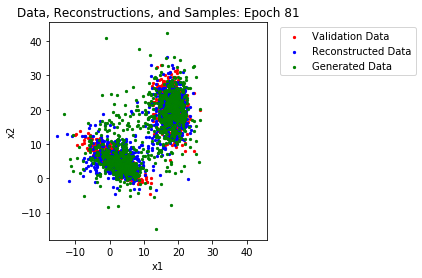

Epoch 82 Average Validation Loss: 8.0241


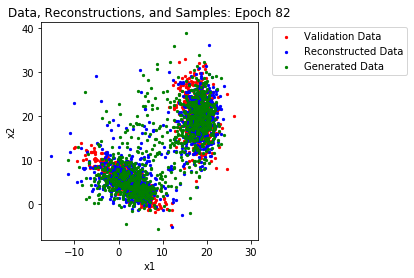

Epoch 83 Average Validation Loss: 8.0397


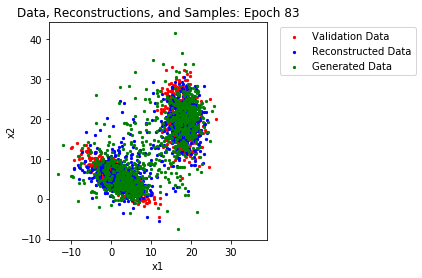

Epoch 84 Average Validation Loss: 8.0403


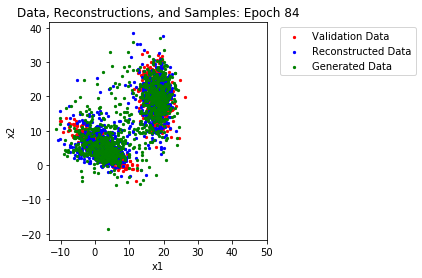

Epoch 85 Average Validation Loss: 8.0211


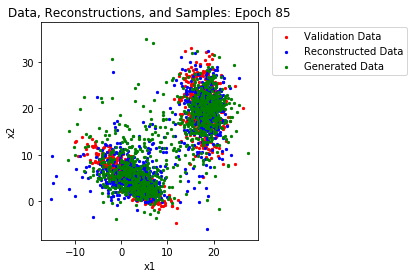

Epoch 86 Average Validation Loss: 8.0146


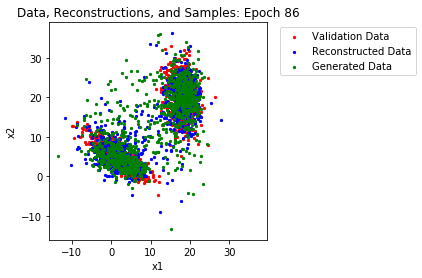

Epoch 87 Average Validation Loss: 8.0150


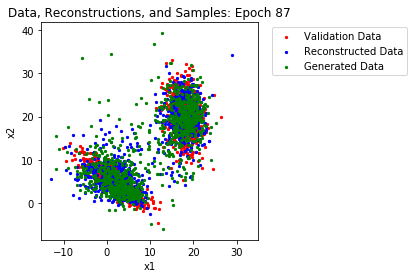

Epoch 88 Average Validation Loss: 8.0598


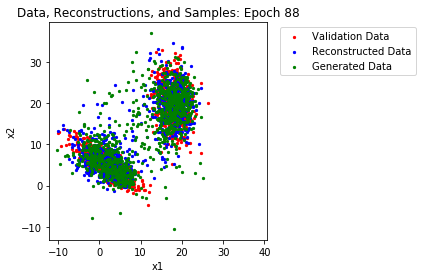

Epoch 89 Average Validation Loss: 8.0425


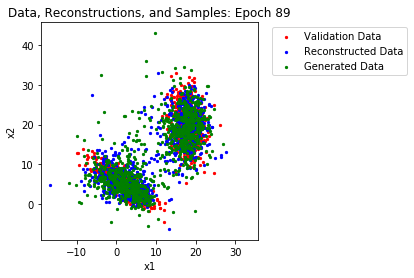

Epoch 90 Average Validation Loss: 8.0535


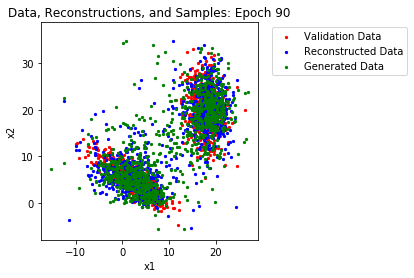

Epoch 91 Average Validation Loss: 8.0466


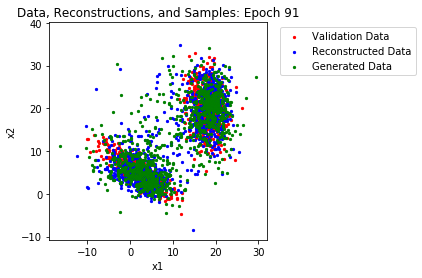

Epoch 92 Average Validation Loss: 8.0835


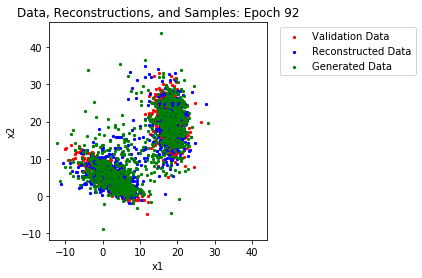

Epoch 93 Average Validation Loss: 8.0105


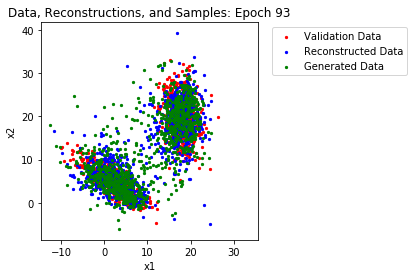

Epoch 94 Average Validation Loss: 7.9553


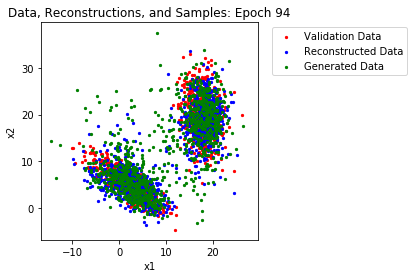

Epoch 95 Average Validation Loss: 8.0246


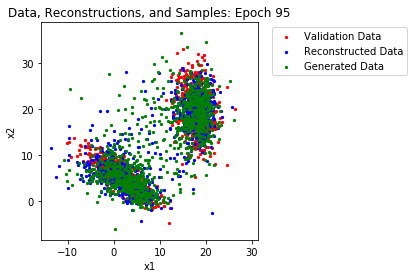

Epoch 96 Average Validation Loss: 8.0302


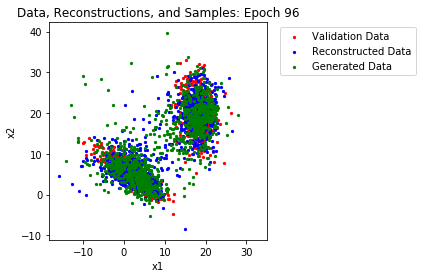

Epoch 97 Average Validation Loss: 7.9970


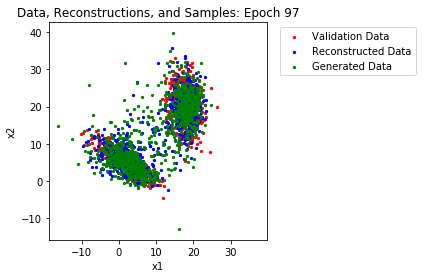

Epoch 98 Average Validation Loss: 8.0068


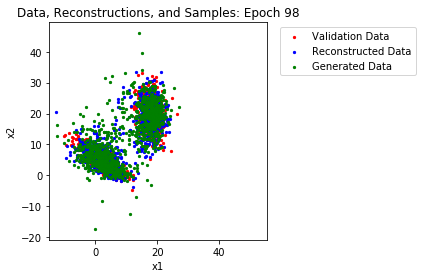

Epoch 99 Average Validation Loss: 7.9821


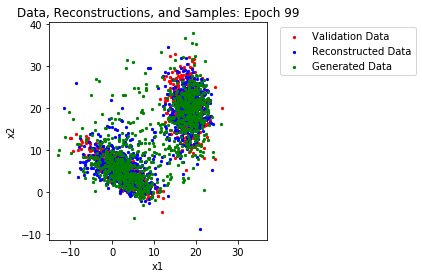

Epoch 100 Average Validation Loss: 7.9806


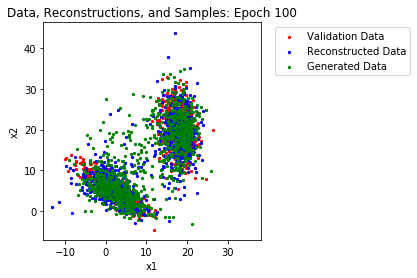

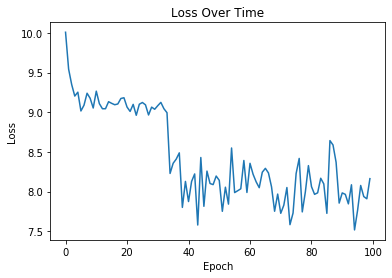

In [19]:
eval(model_list_ex2, loss_list_ex2, valid_loader_ex2, optimizer_ex2)

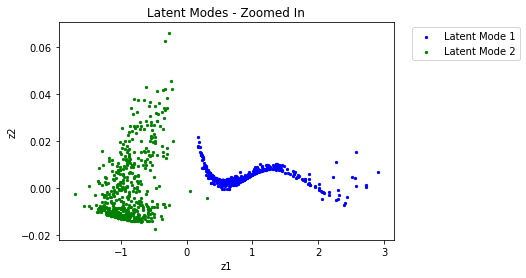

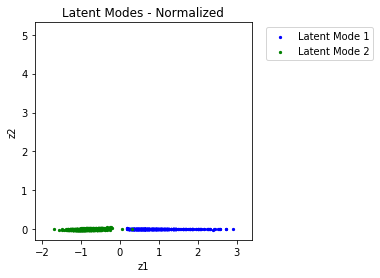

In [20]:
# visualizing the latent space of the final model
final_model_ex2 = model_list_ex2[-1]
latent_data_1 = final_model_ex2._encoder(valid_data_1)  # data from mode 1
latent_data_2 = final_model_ex2._encoder(valid_data_2)  # data from mode 2

# zoomed view
plt.scatter(latent_data_1[:, 0].detach().numpy(), latent_data_1[:, 1].detach().numpy(), c='b', s=5)
plt.scatter(latent_data_2[:, 0].detach().numpy(), latent_data_2[:, 1].detach().numpy(), c='g', s=5)
plt.title("Latent Modes - Zoomed In")
plt.xlabel('z1')
plt.ylabel('z2')
plt.legend(
    ['Latent Mode 1', 'Latent Mode 2'],
    bbox_to_anchor=(1.04,1),
    loc="upper left",
)
plt.show()

# normalized view
plt.scatter(latent_data_1[:, 0].detach().numpy(), latent_data_1[:, 1].detach().numpy(), c='b', s=5)
plt.scatter(latent_data_2[:, 0].detach().numpy(), latent_data_2[:, 1].detach().numpy(), c='g', s=5)
plt.title("Latent Modes - Normalized")
plt.xlabel('z1')
plt.ylabel('z2')
plt.legend(
    ['Latent Mode 1', 'Latent Mode 2'],
    bbox_to_anchor=(1.04,1),
    loc="upper left",
)
ax = plt.gca()
plt.axis('square')
plot_margin = 0.25
x0, x1, y0, y1 = plt.axis()
plt.axis((x0 - plot_margin,
          x1 + plot_margin,
          y0 - plot_margin,
          y1 + plot_margin))
plt.show()

## 5. Example 3: MNIST with VAE

### 5.1 Loading Data

The DOWNLOAD_FLAG flag when set to *True* will download the dataset and the necessary file structure into the directory specified by *data_dir*. Once you do this once, you can set it equal to *False* and it will look in root for the data. If you're reading this, there should be the necessary file structure already with the dataset in it. If there isn't, this lets you generate it.

In [23]:
data_dir = './datasets/'
obs_dim = 784  # MNIST contains 28 x 28 images
DOWNLOAD_FLAG = False

# shape of samples is (B, C, L, L), where B is batch, C is channels=1, L is length=28
train_data_mnist = MNIST(
    root=data_dir,
    train=True,
    transform=torchvision.transforms.ToTensor(),
    download=DOWNLOAD_FLAG,
)
valid_data_mnist = MNIST(
    root=data_dir,
    train=False,
    transform=torchvision.transforms.ToTensor(),
    download=DOWNLOAD_FLAG,
)

### 5.2 Training Settings

I've set the epochs much higher before than this, but it just takes a very long time to train. I've included a model trained over 50 epochs of data in the ckpts folder, which you can load when generating random samples.

In [24]:
# hyperparameters
latent_dim = 2
batch_size = 32
epochs = 10
lr = 1e-3  # initial learning rateminibatch
step_size = 100  # steps per decay for lr scheduler
gamma = 0.95  # multiplicative decay for lr scheduler

In [36]:
# preparing dataloaders, optimizer, and scheduler
model_ex3 = VAE2(latent_dim, obs_dim)
train_loader_ex3 = torch.utils.data.DataLoader(
    train_data_mnist,
    batch_size=batch_size,
    shuffle=True,
    drop_last=True,
)
valid_loader_ex3 = torch.utils.data.DataLoader(
    valid_data_mnist,
    batch_size=batch_size,
    shuffle=True,
    drop_last=True,
)
optimizer_ex3 = optim.Adam(model_ex3.parameters(), lr=lr)
scheduler_ex3 = optim.lr_scheduler.StepLR(optimizer=optimizer_ex3, step_size=step_size, gamma=gamma)

### 5.3 Training

If you're not tinkering with things specifically, you probably don't want to run the train() block! It takes a lot longer to train a model on data this high-dimensional compared to the extremely low-dimensional data we used before. The first block here just (optionally) selects a model to start training from, useful if you have a checkpoint of a partially trained model. The second block actually trains the model.

In [37]:
# checkpointing
ckpt_path = None  # train from scratch
# ckpt_path = "./ckpts/VAE_MNIST_LOCAL.pth"  # train from saved model

In [38]:
model_list_ex3, loss_list_ex3 = train(
    model_ex3,
    epochs,
    train_loader_ex3,
    optimizer_ex3,
    scheduler=scheduler_ex3,
    vae_type=2,
    print_iter=100,
    ckpt_path=ckpt_path,
)
torch.save(model_list_ex3[-1].state_dict(), './ckpts/VAE_MNIST_LOCAL.pth')

Epoch: 1	Iteration: 100	Loss: 196.6197
Epoch: 1	Iteration: 200	Loss: 200.3084
Epoch: 1	Iteration: 300	Loss: 163.8946
Epoch: 1	Iteration: 400	Loss: 172.5596
Epoch: 1	Iteration: 500	Loss: 166.3033
Epoch: 1	Iteration: 600	Loss: 174.9170
Epoch: 1	Iteration: 700	Loss: 159.7830
Epoch: 1	Iteration: 800	Loss: 173.6197
Epoch: 1	Iteration: 900	Loss: 179.9393
Epoch: 1	Iteration: 1000	Loss: 159.3957
Epoch: 1	Iteration: 1100	Loss: 167.7457
Epoch: 1	Iteration: 1200	Loss: 173.2477
Epoch: 1	Iteration: 1300	Loss: 162.1042
Epoch: 1	Iteration: 1400	Loss: 158.1158
Epoch: 1	Iteration: 1500	Loss: 169.5764
Epoch: 1	Iteration: 1600	Loss: 165.2652
Epoch: 1	Iteration: 1700	Loss: 156.1889
Epoch: 1	Iteration: 1800	Loss: 168.8092
Epoch: 2	Iteration: 1900	Loss: 150.9475
Epoch: 2	Iteration: 2000	Loss: 142.8605
Epoch: 2	Iteration: 2100	Loss: 158.7757
Epoch: 2	Iteration: 2200	Loss: 144.5686
Epoch: 2	Iteration: 2300	Loss: 158.2393
Epoch: 2	Iteration: 2400	Loss: 157.9126
Epoch: 2	Iteration: 2500	Loss: 151.9883
Epoch: 2	

### 5.4 Evaluation

Since the data are 784-dimensional, we can't just plot them to visualize the distribution. However, we can just draw samples from the model at each stage in training to see if it outputs stuff that looks reasonably like images of digits. 

Run the first block to reconstruct the first sample from the validation set at each epoch and also to generate a random sample. You can only run this right after the train() function is called or you won't have the model lists. However, you can still use the generation code below to write something to test reconstruction on the cached model.

Run the second block to sample a random image from the final model. You can run this as many times as you want to generate samples. Observe that every time you run it, a different number will appear. This is because you can't control the conditioning of the sample. Again, CVAEs address this problem.

Run the third block to visualize the latent manifold (both with sampled images and with the validation set). To generate the first plot, we sweep through latent values from -5 to 5 on each axis and then pass that through the decoder to see what is generated. Recall that for our specific model, this mapping is deterministic. For the second plot, we simply encode the validation set and sample from the resulting distribution. Notice how you can tell where in space the numbers are encoded by comparing the two plots! Code adapted from: https://github.com/ykwon0407/variational_autoencoder/blob/master/variational_bayes.ipynb

Epoch 1 Average Validation Loss: 162.1169
Epoch 2 Average Validation Loss: 155.3288
Epoch 3 Average Validation Loss: 152.3197
Epoch 4 Average Validation Loss: 150.5476
Epoch 5 Average Validation Loss: 148.3428
Epoch 6 Average Validation Loss: 147.4445
Epoch 7 Average Validation Loss: 145.8412
Epoch 8 Average Validation Loss: 145.6305
Epoch 9 Average Validation Loss: 144.7326
Epoch 10 Average Validation Loss: 145.2119


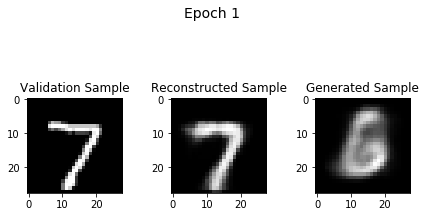

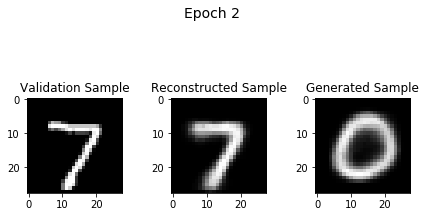

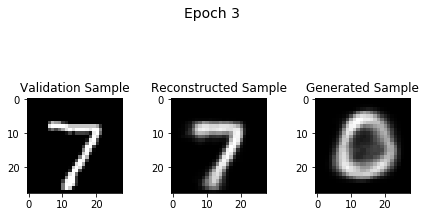

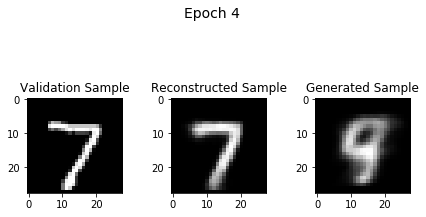

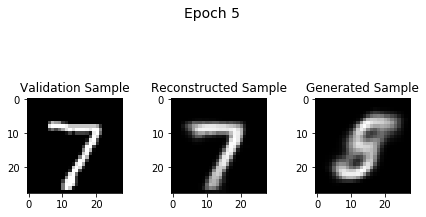

...

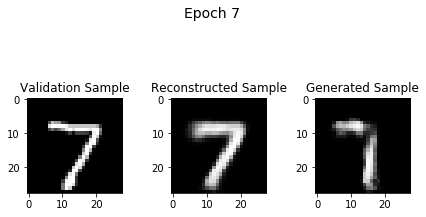

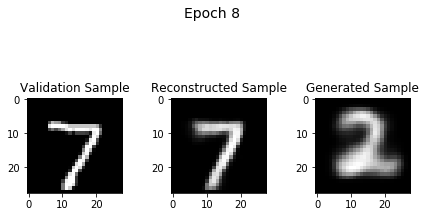

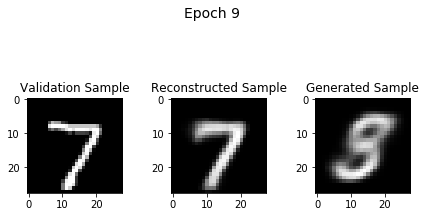

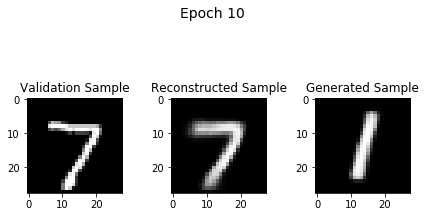

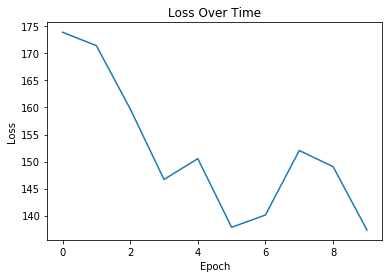

In [39]:
eval(model_list_ex3, loss_list_ex3, valid_loader_ex3, optimizer_ex3, vae_type=2)

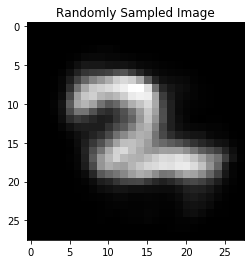

In [41]:
# generate random samples of handwritten numbers
final_model_ex3 = VAE2(2, 784)
final_model_ex3.load_state_dict(torch.load('./ckpts/VAE_MNIST.pth'))  # provided model
img_sample = final_model_ex3.generate(1)
plt.imshow(img_sample.detach(), cmap='gray')
plt.title('Randomly Sampled Image')
plt.show()

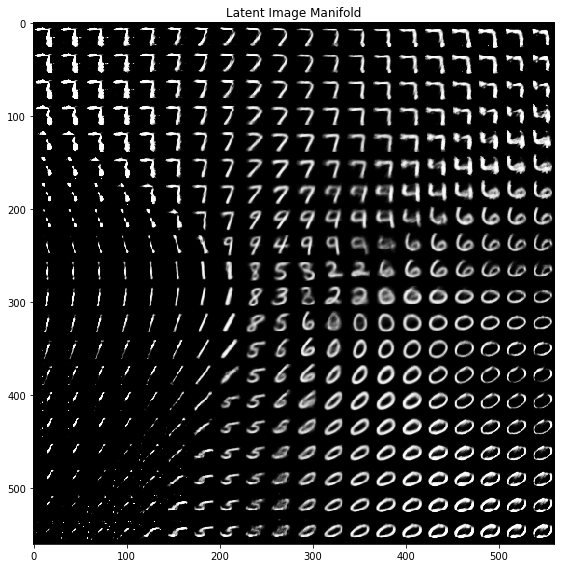

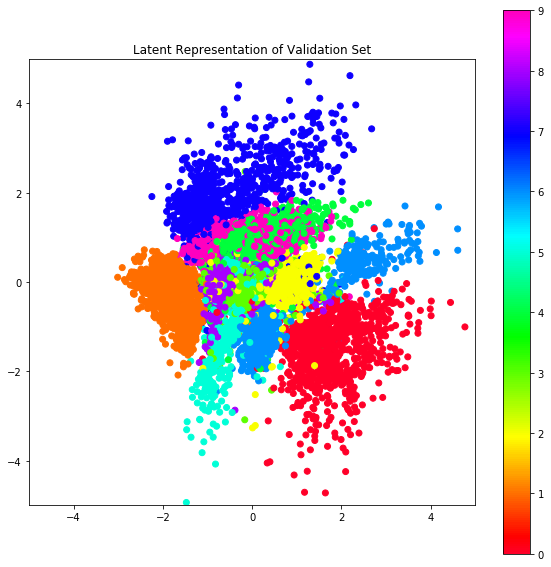

In [40]:
# loading model
final_model_ex3 = VAE2(2, 784)
final_model_ex3.load_state_dict(torch.load('./ckpts/VAE_MNIST.pth'))  # provided model

# ############## #
# IMAGE MANIFOLD #
# ############## #

# initializing latent manifold
num_points = 20
z1_vals = np.linspace(-5, 5, num_points)
z2_vals = np.linspace(-5, 5, num_points)
manifold = np.empty((28 * num_points, 28 * num_points))

# looping through latent values to fill manifold
for i, z2i in enumerate(z1_vals):
    for j, z1j in enumerate(z2_vals):
        z = torch.Tensor([z1j, z2i])
        x_gen_flat = final_model_ex3._decoder(z)
        x_gen = x_gen_flat.reshape(28, 28)
        manifold[
            ((num_points - i - 1) * 28) : ((num_points - i) * 28),
            (j * 28):((j + 1) * 28)
        ] = x_gen.detach()

# plotting image manifold
plt.figure(figsize=(8, 8))
plt.imshow(manifold, cmap='gray', origin='upper')
plt.title('Latent Image Manifold')
plt.tight_layout()

# ########### #
# LATENT PLOT #
# ########### #

# decoding validation dataset
x_valid = valid_data_mnist.data / 255.0
out_e = final_model_ex3._encoder(x_valid.reshape(-1, 784))
mu_e = out_e[..., :latent_dim]
var_e = out_e[..., latent_dim:]
z = final_model_ex3.reparameterize(mu_e, var_e)
targets = valid_data_mnist.targets.numpy()

# plotting latent space
plt.figure(figsize=(10, 10))
cm = plt.cm.get_cmap('gist_rainbow')
plt.scatter(mu_e[..., 0].detach(), mu_e[..., 1].detach(), c=targets, cmap=cm)
plt.title('Latent Representation of Validation Set')
plt.axis('square')minibatch
plt.xlim((-5, 5))
plt.ylim((-5, 5))
plt.colorbar()

## 6. Example 4: MNIST with CVAE

In this last example, we will explore how we can use conditional information to improve sampling and inference. The conditional variable we will use is the label, and we will use this to predict the image. We will see this gives us greater control over what we sample from the generative model. An implementation note: since the labels aren't continuous-valued variables, we would like to encode them as *one-hot vectors*, which represent the categorical value of an *n*-valued integer. For example, we encode each digit from 0 to 9 as a different vector whose components are all 0.0 except for the index corresponding to the digit, which is 1.0.

I provide a model trained for 10 epochs. You can obviously train for longer than this.

The data should be loaded from the cell in section 5.1.

### 6.1 Training Settings

In [95]:
# hyperparameters
latent_dim = 2
input_dim = 10
batch_size = 32
epochs = 10  # again, this could be higher
lr = 1e-3  # initial learning rate
step_size = 100  # steps per decay for lr scheduler
gamma = 0.95  # multiplicative decay for lr scheduler

In [96]:
# preparing dataloaders, optimizer, and scheduler
model_ex4 = CVAE(latent_dim, obs_dim, input_dim)
train_loader_ex4 = torch.utils.data.DataLoader(
    train_data_mnist,
    batch_size=batch_size,
    shuffle=True,
    drop_last=True,
)
valid_loader_ex4 = torch.utils.data.DataLoader(
    valid_data_mnist,
    batch_size=batch_size,
    shuffle=True,
    drop_last=True,
)
optimizer_ex4 = optim.Adam(model_ex4.parameters(), lr=lr)

# optional lr scheduler
scheduler_ex4 = optim.lr_scheduler.StepLR(optimizer=optimizer_ex4, step_size=step_size, gamma=gamma)
# scheduler_ex4 = None

### 6.2 Training

In [97]:
# checkpointing
ckpt_path = None  # train from scratch
# ckpt_path = "./ckpts/CVAE_MNIST_LOCAL.pth"  # train from saved model

In [98]:
model_list_ex4, loss_list_ex4 = train(
    model_ex4,
    epochs,
    train_loader_ex4,
    optimizer_ex4,
    scheduler=scheduler_ex4,
    vae_type=3,
    print_iter=100,
    ckpt_path=ckpt_path,
)
torch.save(model_list_ex4[-1].state_dict(), './ckpts/CVAE_MNIST_LOCAL.pth')

Epoch: 1	Iteration: 100	Loss: 202.0485
Epoch: 1	Iteration: 200	Loss: 182.5941
Epoch: 1	Iteration: 300	Loss: 183.0998
Epoch: 1	Iteration: 400	Loss: 184.5529
Epoch: 1	Iteration: 500	Loss: 161.6660
Epoch: 1	Iteration: 600	Loss: 159.6027
Epoch: 1	Iteration: 700	Loss: 135.9140
Epoch: 1	Iteration: 800	Loss: 147.0568
Epoch: 1	Iteration: 900	Loss: 151.6179
Epoch: 1	Iteration: 1000	Loss: 139.0743
Epoch: 1	Iteration: 1100	Loss: 131.0147
Epoch: 1	Iteration: 1200	Loss: 135.7807
Epoch: 1	Iteration: 1300	Loss: 138.7304
Epoch: 1	Iteration: 1400	Loss: 140.9664
Epoch: 1	Iteration: 1500	Loss: 139.9396
Epoch: 1	Iteration: 1600	Loss: 151.1643
Epoch: 1	Iteration: 1700	Loss: 127.1565
Epoch: 1	Iteration: 1800	Loss: 136.4105
Epoch: 2	Iteration: 1900	Loss: 133.0225
Epoch: 2	Iteration: 2000	Loss: 134.5034
Epoch: 2	Iteration: 2100	Loss: 144.5349
Epoch: 2	Iteration: 2200	Loss: 133.8207
Epoch: 2	Iteration: 2300	Loss: 120.4748
Epoch: 2	Iteration: 2400	Loss: 141.4277
Epoch: 2	Iteration: 2500	Loss: 138.0935
Epoch: 2	

### 6.3 Evaluation

We can look at the same evaluations as before. Note that when generating samples, we now have to provide the conditioning variable (the label corresponding to the number we want to generate).

In the second block, we can now choose one of each digit to generate! It sometimes doesn't get it exactly right, but for the most part, it does pretty well. We can train the model for longer to get better performance.

The latent manifold visualization is a bit different. Now, our latent image manifolds must be conditioned on the labels, so there isn't a nice way to visualize an unconditional latent space. However, we CAN visualize the latent manifolds for each digit. The latent space no longer encodes information about what digit the data is represented by, but instead other qualitative features like how slanted the number is written. The provided label encapsulates a large portion of the statistical information in each image. In the third cell, we plot the manifolds for digits from 0 to 9. In the second plot, we overlay all the conditional latent samples from each digit in the validation set. Notice how the distributions all overlap now! This is because the types of features encode in the latent space are now shared across each digit. In other words, the digit "7" and "9" can both be slanted the same way, for example, so they can both map to the same point in latent space. The distinction between "7"-ness or "9"-ness is expressed by the label.

Epoch 1 Average Validation Loss: 139.8664
Epoch 2 Average Validation Loss: 135.1349
Epoch 3 Average Validation Loss: 133.6484
Epoch 4 Average Validation Loss: 132.3783
Epoch 5 Average Validation Loss: 132.1516
Epoch 6 Average Validation Loss: 131.5936
Epoch 7 Average Validation Loss: 131.1566
Epoch 8 Average Validation Loss: 130.7143
Epoch 9 Average Validation Loss: 130.3656
Epoch 10 Average Validation Loss: 130.2793


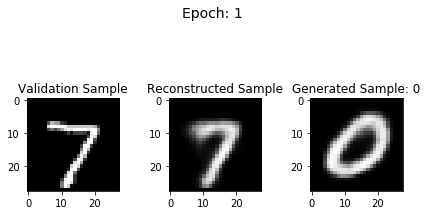

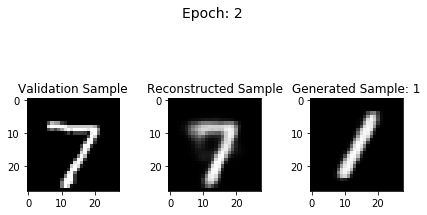

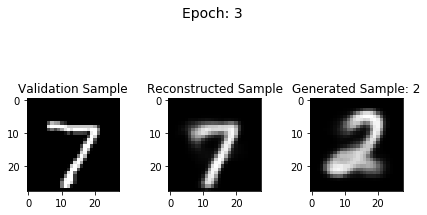

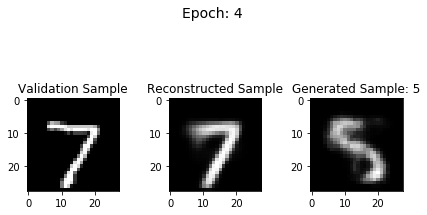

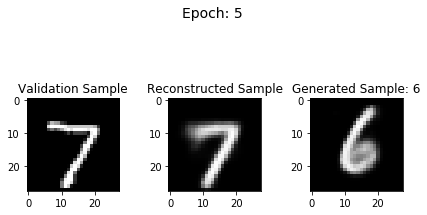

...

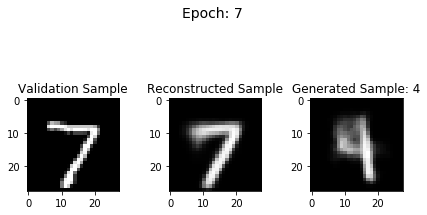

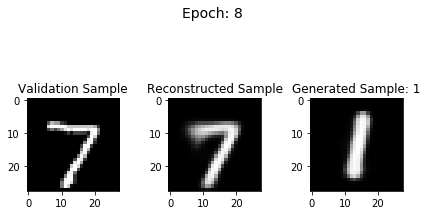

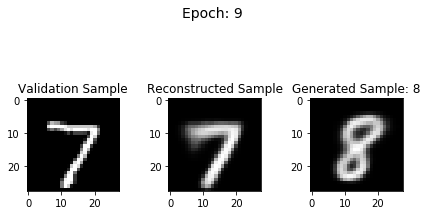

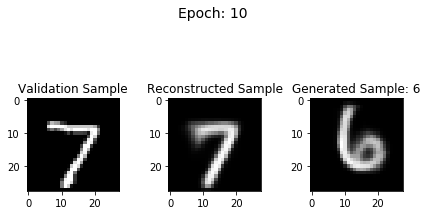

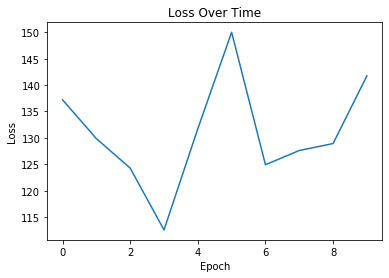

In [99]:
eval(model_list_ex4, loss_list_ex4, valid_loader_ex4, optimizer_ex4, vae_type=3)

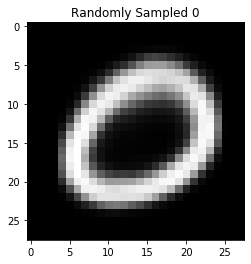

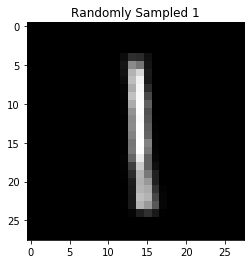

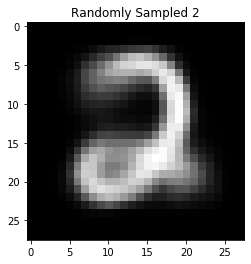

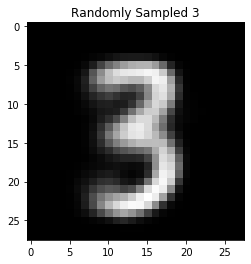

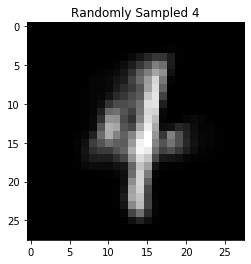

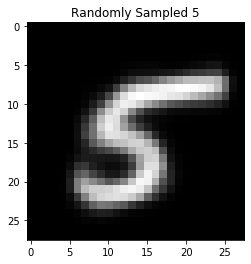

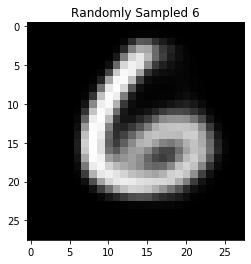

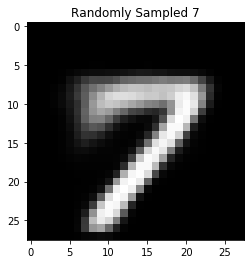

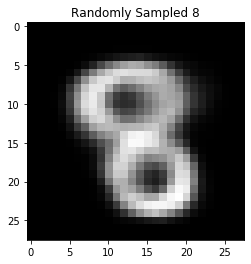

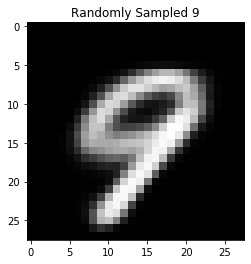

In [100]:
# generate random samples of handwritten numbers
final_model_ex4 = CVAE(2, 784, 10)
final_model_ex4.load_state_dict(torch.load('./ckpts/CVAE_MNIST.pth'))  # provided model

for i in range(10):
    digit = one_hot_mnist(torch.LongTensor([i]).unsqueeze(-1))
    img_sample = final_model_ex4.generate(1, digit)
    plt.imshow(img_sample.detach(), cmap='gray')
    plt.title(f'Randomly Sampled {i}')
    plt.show()

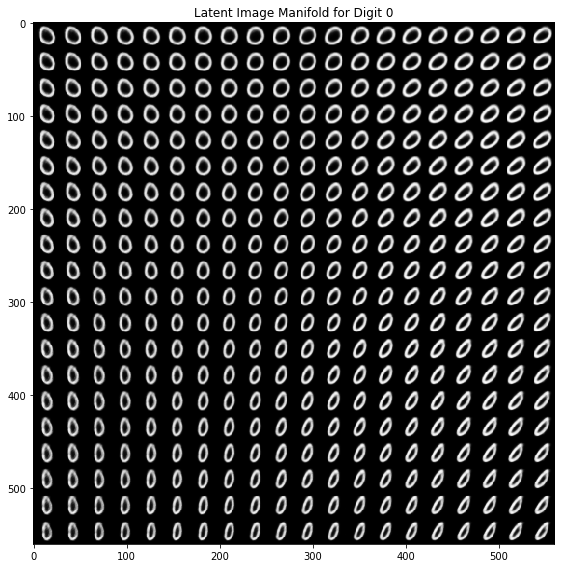

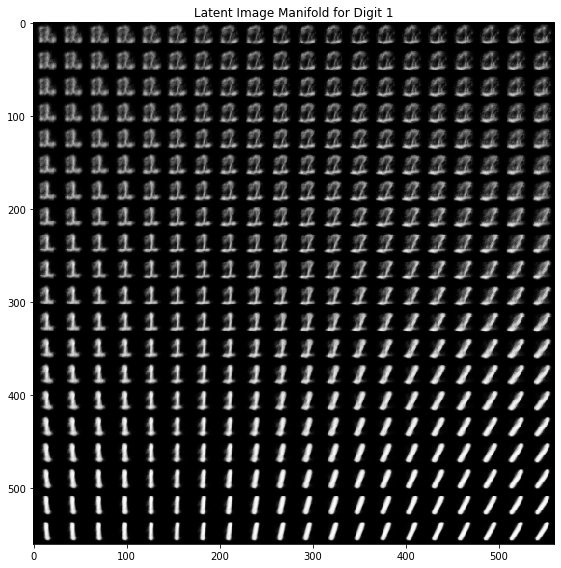

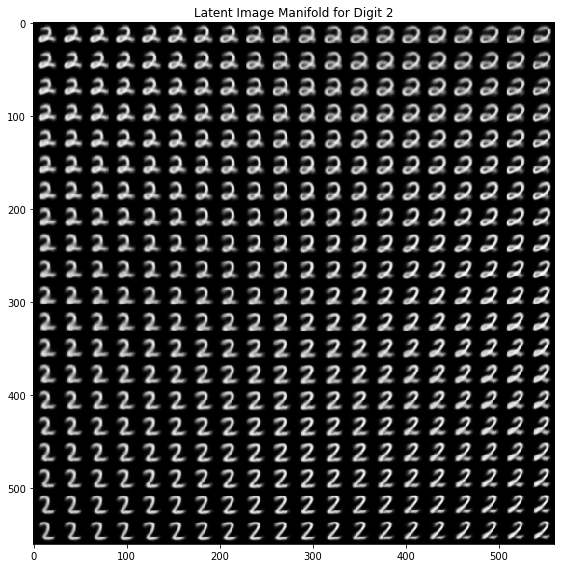

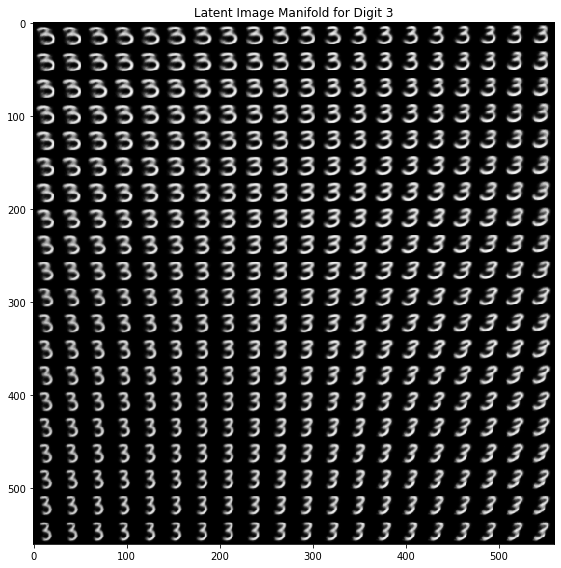

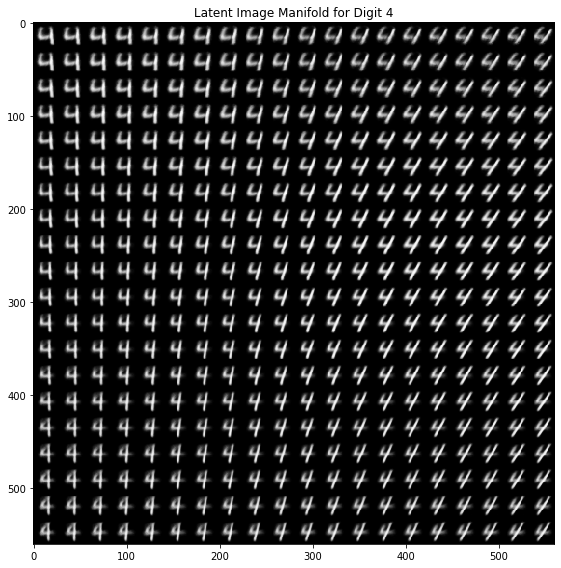

...

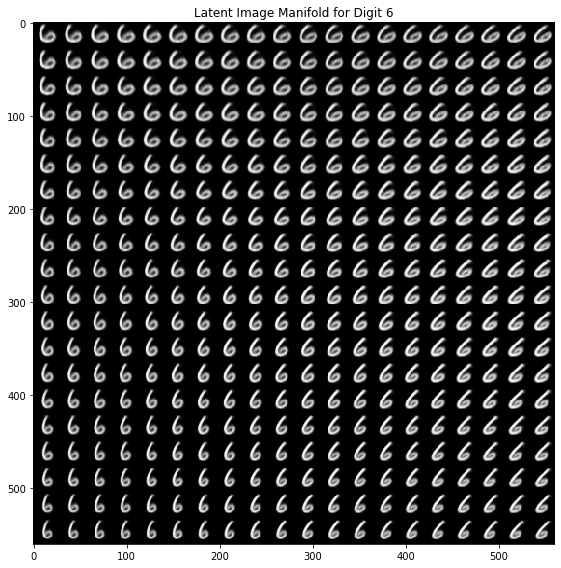

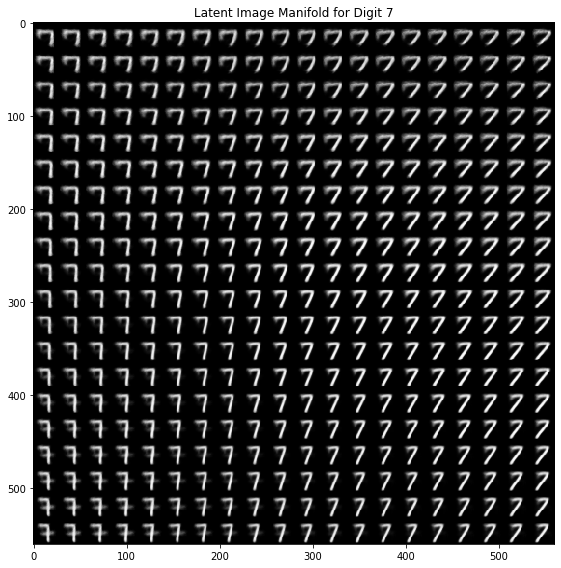

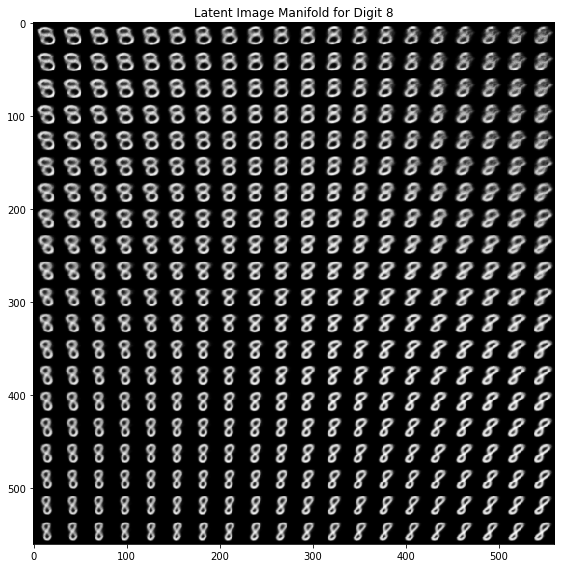

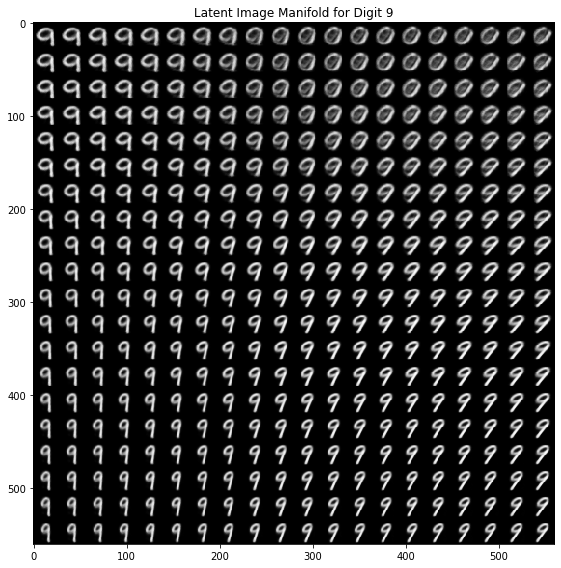

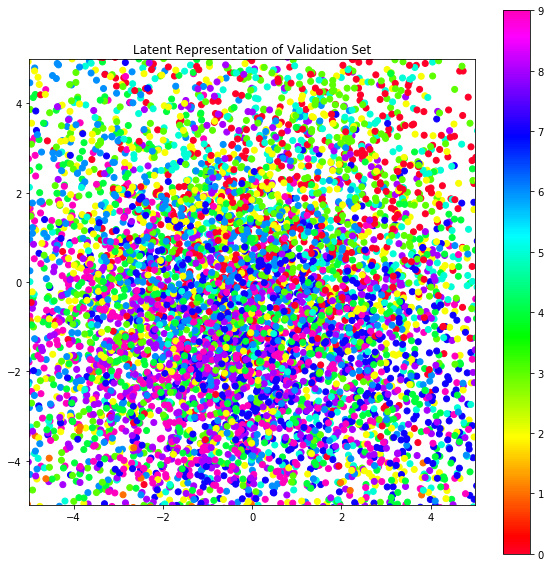

In [106]:
# loading model
final_model_ex4 = CVAE(2, 784, 10)
final_model_ex4.load_state_dict(torch.load('./ckpts/CVAE_MNIST.pth'))  # provided model
    
# latent image manifolds for each digit
for digit in range(10):
    label = torch.LongTensor([digit]).unsqueeze(-1)
    label = one_hot_mnist(label)

    # ############## #
    # IMAGE MANIFOLD #
    # ############## #

    # initializing latent manifold
    num_points = 20
    z1_vals = np.linspace(-5, 5, num_points)
    z2_vals = np.linspace(-5, 5, num_points)
    manifold = np.empty((28 * num_points, 28 * num_points))

    # looping through latent values to fill manifold
    for i, z2i in enumerate(z1_vals):
        for j, z1j in enumerate(z2_vals):
            z = torch.Tensor([z1j, z2i]).unsqueeze(0)
            x_gen_flat = final_model_ex4._decoder(torch.cat([z, label], dim=-1))
            x_gen = x_gen_flat.reshape(28, 28)
            manifold[
                ((num_points - i - 1) * 28) : ((num_points - i) * 28),
                (j * 28):((j + 1) * 28)
            ] = x_gen.detach()

    # plotting image manifold
    plt.figure(figsize=(8, 8))
    plt.imshow(manifold, cmap='gray', origin='upper')
    plt.title(f'Latent Image Manifold for Digit {digit}')
    plt.tight_layout()

# ########### #
# LATENT PLOT #
# ########### #

# decoding validation dataset
x_valid = valid_data_mnist.data / 255.0
c_valid = valid_data_mnist.targets.unsqueeze(-1)
c_valid = one_hot_mnist(c_valid)
out_e = final_model_ex4._encoder(
    torch.cat([x_valid.reshape(-1, 784),
               c_valid],
              dim=-1,
    )
)
mu_e = out_e[..., :latent_dim]
var_e = out_e[..., latent_dim:]
z = final_model_ex4.reparameterize(mu_e, var_e)
targets = valid_data_mnist.targets.numpy()

# plotting latent space
plt.figure(figsize=(10, 10))
cm = plt.cm.get_cmap('gist_rainbow')
plt.scatter(mu_e[..., 0].detach(), mu_e[..., 1].detach(), c=targets, cmap=cm)
plt.title('Latent Representation of Validation Set')
plt.axis('square')
plt.xlim((-5, 5))
plt.ylim((-5, 5))
plt.colorbar()